In [1]:
import numpy
print("numpy:", numpy.__version__)
import scanpy
print("scanpy:", scanpy.__version__)
import decipher
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import scanpy as sc
import decipher as dc
import anndata as ad
import os
import matplotlib as mpl
import pandas as pd
# Set global font sizes
mpl.rcParams.update({'font.size': 10, 'svg.fonttype': 'none'})
mpl.rcParams['axes.titlesize'] = 12
mpl.rcParams['axes.labelsize'] = 10      # For x and y axis labels
mpl.rcParams['xtick.labelsize'] = 10     # For x-axis tick labels
mpl.rcParams['ytick.labelsize'] = 10     # For y-axis tick labels  
mpl.rcParams['legend.fontsize'] = 10     # For legend text
mpl.rcParams['legend.title_fontsize'] = 10  # For legend titles

numpy: 1.26.4
scanpy: 1.11.2


In [2]:
base_path = "/home/user/Documents/Kinase_project_backup/GBM_T_Cells"  # Current working directory

dose_folders = [
    "filtered_feature_bc_matrix_0",
    "filtered_feature_bc_matrix_0.5",
    "filtered_feature_bc_matrix_1",
    "filtered_feature_bc_matrix_2"
]

out_dir  = "/home/user/Documents/Kinase_project/figures/T_cell_figures"

In [3]:
adatas = []

In [4]:
for folder in dose_folders:
    path = os.path.join(base_path, folder)
    adata = sc.read_10x_mtx(path, var_names='gene_symbols', cache=True)
    dose_label = folder.replace("filtered_feature_bc_matrix_", "")
    adata.obs["dose"] = dose_label
    adatas.append(adata)

In [5]:
adata_combined = ad.concat(adatas, label="dose", keys=[f.replace("filtered_feature_bc_matrix_", "") for f in dose_folders])
adata_combined.obs_names_make_unique()
print(adata_combined)

AnnData object with n_obs × n_vars = 7296 × 36601
    obs: 'dose'


/home/user/anaconda3/lib/python3.12/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


In [6]:
# mitochondrial genes, "MT-" for human, "Mt-" for mouse
adata_combined.var["mt"] = adata_combined.var_names.str.startswith("MT-")
# ribosomal genes
adata_combined.var["ribo"] = adata_combined.var_names.str.startswith(("RPS", "RPL"))

In [7]:
sc.pp.calculate_qc_metrics(
    adata_combined, qc_vars=["mt", "ribo"], inplace=True, log1p=True
)
sc.pp.calculate_qc_metrics(adata, inplace=True)

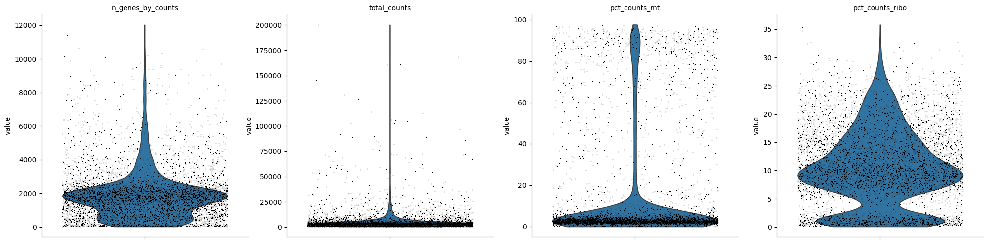

In [8]:
sc.pl.violin(
    adata_combined,
    ["n_genes_by_counts", "total_counts", "pct_counts_mt","pct_counts_ribo"],
    jitter=0.4,
    multi_panel=True,
)

In [9]:
np.mean(adata_combined.obs["total_counts"])

5244.7856

In [10]:
unique_doses = adata_combined.obs['dose'].unique()
palette = sns.color_palette("Set2", n_colors=len(unique_doses))
color_palette = dict(zip(unique_doses, palette.as_hex()))

In [11]:
color_palette

{'0': '#66c2a5', '0.5': '#fc8d62', '1': '#8da0cb', '2': '#e78ac3'}

In [12]:
adata_combined.X[1:20,1:20].toarray()  # Convert sparse matrix to dense format if needed

array([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
        0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.

In [13]:
unique_doses

# replace does with new set of categories
dose_mapping = {
    "0": "Untreated_Tcells",
    "0.5": "0.5Tto1GBM",
    "1": "1Tto1GBM",
    "2": "2Tto1GBM"
}
adata_combined.obs['dosage'] = adata_combined.obs['dose'].map(dose_mapping)


In [14]:
adata_combined.obs

,dose,n_genes_by_counts,log1p_n_genes_by_counts,total_counts,log1p_total_counts,pct_counts_in_top_50_genes,pct_counts_in_top_100_genes,pct_counts_in_top_200_genes,pct_counts_in_top_500_genes,total_counts_mt,log1p_total_counts_mt,pct_counts_mt,total_counts_ribo,log1p_total_counts_ribo,pct_counts_ribo,dosage
AAACCCACACGTGTGC-1,0,1887,7.543273,3378.0,8.125335,18.798105,26.080521,36.264062,55.950266,64.0,4.174387,1.894612,287.0,5.662961,8.496152,Untreated_Tcells
AAACCCAGTAAGAACT-1,0,2047,7.624619,3654.0,8.203852,17.898194,24.274767,33.935413,52.900930,160.0,5.081404,4.378763,205.0,5.327876,5.610290,Untreated_Tcells
AAACCCATCTTACGTT-1,0,1767,7.477604,3106.0,8.041413,20.057952,27.817128,38.441726,58.660657,89.0,4.499810,2.865422,283.0,5.648974,9.111397,Untreated_Tcells
AAACGAAAGCGCCTCA-1,0,1971,7.586804,3346.0,8.115820,17.005380,24.237896,34.369396,53.885236,116.0,4.762174,3.466826,294.0,5.686975,8.786611,Untreated_Tcells
AAACGAAAGGGCAAGG-1,0,2210,7.701200,3993.0,8.292548,17.680942,25.043827,34.585525,52.266466,108.0,4.691348,2.704733,427.0,6.059123,10.693714,Untreated_Tcells
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGGAGAGCGACTAG-1,2,781,6.661855,1185.0,7.078341,26.160338,36.708861,50.970464,76.286920,29.0,3.401197,2.447257,192.0,5.262690,16.202532,2Tto1GBM
TTTGGTTCACAGAAGC-1,2,1775,7.482119,3150.0,8.055475,18.920635,28.349206,39.396825,59.238095,92.0,4.532599,2.920635,514.0,6.244167,16.317459,2Tto1GBM
TTTGGTTGTATTGACC-1,2,1587,7.370231,3513.0,8.164511,31.454597,40.905209,51.465983,69.057785,64.0,4.174387,1.821805,692.0,6.541030,19.698263,2Tto1GBM
TTTGTTGCACACACTA-1,2,507,6.230481,692.0,6.541030,27.312139,41.184971,55.635838,98.988439,32.0,3.496508,4.624277,109.0,4.700480,15.751446,2Tto1GBM


In [15]:
adata_combined.obs

,dose,n_genes_by_counts,log1p_n_genes_by_counts,total_counts,log1p_total_counts,pct_counts_in_top_50_genes,pct_counts_in_top_100_genes,pct_counts_in_top_200_genes,pct_counts_in_top_500_genes,total_counts_mt,log1p_total_counts_mt,pct_counts_mt,total_counts_ribo,log1p_total_counts_ribo,pct_counts_ribo,dosage
AAACCCACACGTGTGC-1,0,1887,7.543273,3378.0,8.125335,18.798105,26.080521,36.264062,55.950266,64.0,4.174387,1.894612,287.0,5.662961,8.496152,Untreated_Tcells
AAACCCAGTAAGAACT-1,0,2047,7.624619,3654.0,8.203852,17.898194,24.274767,33.935413,52.900930,160.0,5.081404,4.378763,205.0,5.327876,5.610290,Untreated_Tcells
AAACCCATCTTACGTT-1,0,1767,7.477604,3106.0,8.041413,20.057952,27.817128,38.441726,58.660657,89.0,4.499810,2.865422,283.0,5.648974,9.111397,Untreated_Tcells
AAACGAAAGCGCCTCA-1,0,1971,7.586804,3346.0,8.115820,17.005380,24.237896,34.369396,53.885236,116.0,4.762174,3.466826,294.0,5.686975,8.786611,Untreated_Tcells
AAACGAAAGGGCAAGG-1,0,2210,7.701200,3993.0,8.292548,17.680942,25.043827,34.585525,52.266466,108.0,4.691348,2.704733,427.0,6.059123,10.693714,Untreated_Tcells
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGGAGAGCGACTAG-1,2,781,6.661855,1185.0,7.078341,26.160338,36.708861,50.970464,76.286920,29.0,3.401197,2.447257,192.0,5.262690,16.202532,2Tto1GBM
TTTGGTTCACAGAAGC-1,2,1775,7.482119,3150.0,8.055475,18.920635,28.349206,39.396825,59.238095,92.0,4.532599,2.920635,514.0,6.244167,16.317459,2Tto1GBM
TTTGGTTGTATTGACC-1,2,1587,7.370231,3513.0,8.164511,31.454597,40.905209,51.465983,69.057785,64.0,4.174387,1.821805,692.0,6.541030,19.698263,2Tto1GBM
TTTGTTGCACACACTA-1,2,507,6.230481,692.0,6.541030,27.312139,41.184971,55.635838,98.988439,32.0,3.496508,4.624277,109.0,4.700480,15.751446,2Tto1GBM


In [16]:
adata_combined

AnnData object with n_obs × n_vars = 7296 × 36601
    obs: 'dose', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'dosage'
    var: 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'

In [17]:
adata_combined.obs['dosage'].unique()

['Untreated_Tcells', '0.5Tto1GBM', '1Tto1GBM', '2Tto1GBM']
Categories (4, object): ['Untreated_Tcells', '0.5Tto1GBM', '1Tto1GBM', '2Tto1GBM']

In [18]:
color_palette = {'Untreated_Tcells' : '#415864','0.5Tto1GBM':'#FFD166','1Tto1GBM' : '#FF7F11','2Tto1GBM':'#FF4009'}

In [19]:
adata_combined

AnnData object with n_obs × n_vars = 7296 × 36601
    obs: 'dose', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'dosage'
    var: 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'

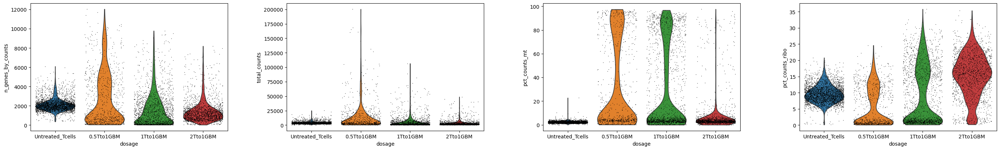

In [20]:
#plotting histogram of mt counts
sc.pl.violin(
    adata_combined,
    ["n_genes_by_counts", "total_counts", "pct_counts_mt","pct_counts_ribo"],
    jitter=0.4,
    multi_panel=True,
    groupby='dosage')

In [21]:
sc.pp.filter_cells(adata_combined, min_genes=200)
sc.pp.filter_genes(adata_combined, min_cells=3)

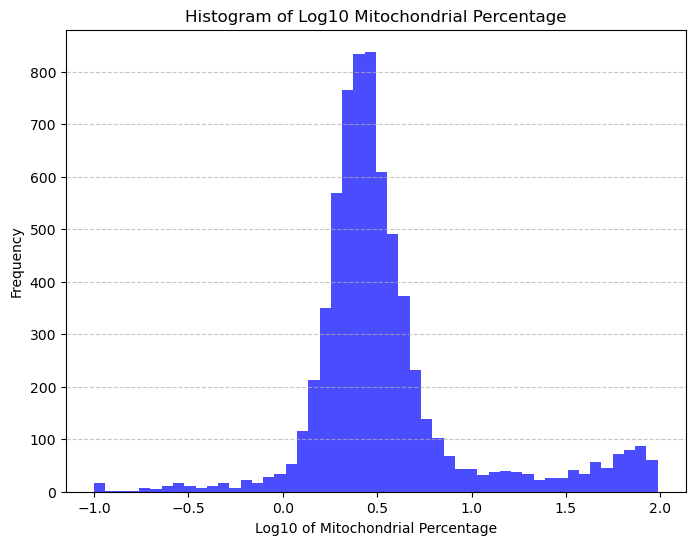

In [22]:
# plot histogram log10 of mt percentage
histogram_data = adata_combined.obs['pct_counts_mt'].copy()
histogram_data = histogram_data[~np.isnan(histogram_data)]  # Remove NaN
plt.figure(figsize=(8, 6))
plt.hist(np.log10(histogram_data+0.1), bins=50, color='blue', alpha=0.7)
plt.xlabel('Log10 of Mitochondrial Percentage')
plt.ylabel('Frequency')
plt.title('Histogram of Log10 Mitochondrial Percentage')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

In [23]:
# filter out cells with high mitochondrial content
adata_combined = adata_combined[adata_combined.obs['pct_counts_mt'] < 10].copy()

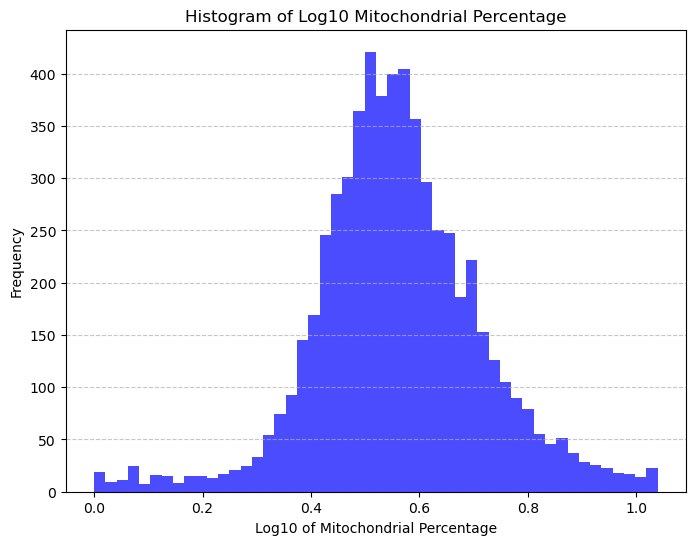

In [24]:
# plot histogram log10 of mt percentage
histogram_data = adata_combined.obs['pct_counts_mt'].copy()
histogram_data = histogram_data[~np.isnan(histogram_data)]  # Remove NaN
plt.figure(figsize=(8, 6))
plt.hist(np.log10(histogram_data + 1), bins=50, color='blue', alpha=0.7)
plt.xlabel('Log10 of Mitochondrial Percentage')
plt.ylabel('Frequency')
plt.title('Histogram of Log10 Mitochondrial Percentage')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

In [25]:
#!pip install scrublet

In [26]:
import scrublet as scr

In [27]:
scrub = scr.Scrublet(adata_combined.X)
doublet_scores, predicted_doublets = scrub.scrub_doublets()
doublet_scores

Preprocessing...
Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.45
Detected doublet rate = 2.5%
Estimated detectable doublet fraction = 28.1%
Overall doublet rate:
	Expected   = 10.0%
	Estimated  = 8.8%
Elapsed time: 3.1 seconds


array([0.09558824, 0.13622291, 0.07843137, ..., 0.06470588, 0.04133545,
       0.21568627])

In [28]:
adata_combined.obs["doublet_score"] = doublet_scores
adata_combined.obs["is_doublet"] = predicted_doublets
adata_combined.obs['is_doublet'] = adata_combined.obs['is_doublet'].astype(str)

In [29]:
# Get counts without using .sum() which might cause issues
true_count = (adata_combined.obs['is_doublet'] == "True").sum()
false_count = (adata_combined.obs['is_doublet'] == "False").sum()

# Total count
total = true_count + false_count

# Calculate percentages
true_percent = (true_count / total) * 100 if total > 0 else 0
false_percent = (false_count / total) * 100 if total > 0 else 0

print(f"True values (doublets): {true_count} ({true_percent:.2f}%)")
print(f"False values (singlets): {false_count} ({false_percent:.2f}%)")

True values (doublets): 150 (2.49%)
False values (singlets): 5884 (97.51%)


In [30]:
adata_combined.obs['is_doublet']

AAACCCACACGTGTGC-1    False
AAACCCAGTAAGAACT-1    False
AAACCCATCTTACGTT-1    False
AAACGAAAGCGCCTCA-1    False
AAACGAAAGGGCAAGG-1    False
                      ...  
TTTGACTTCCAGGACC-1    False
TTTGGAGAGCGACTAG-1     True
TTTGGTTCACAGAAGC-1    False
TTTGGTTGTATTGACC-1    False
TTTGTTGCACACACTA-1    False
Name: is_doublet, Length: 6034, dtype: object

In [31]:
# remove doublets
adata_combined = adata_combined[adata_combined.obs['is_doublet'] == "False"].copy()

In [32]:
adata_combined

AnnData object with n_obs × n_vars = 5884 × 25569
    obs: 'dose', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'dosage', 'n_genes', 'doublet_score', 'is_doublet'
    var: 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells'
    uns: 'dosage_colors'

... storing 'is_doublet' as categorical


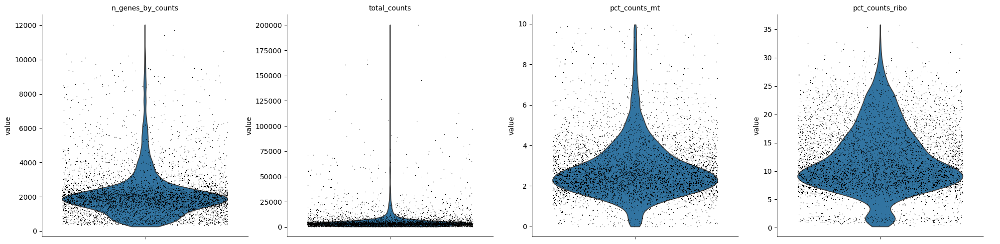

In [33]:
sc.pl.violin(
    adata_combined,
    ["n_genes_by_counts", "total_counts", "pct_counts_mt","pct_counts_ribo"],
    jitter=0.4,
    multi_panel=True,
)

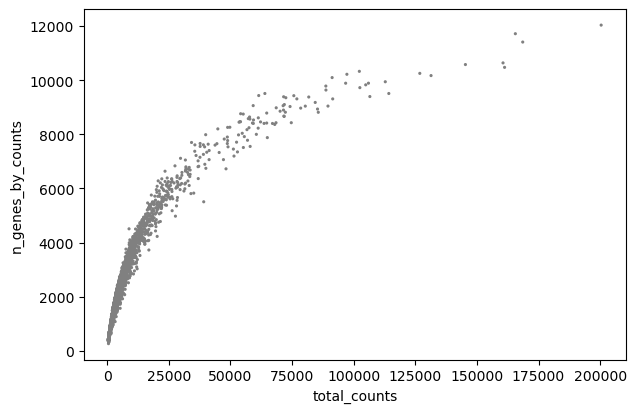

In [34]:
# plot total counts vs n_genes_by_counts
sc.pl.scatter(adata_combined, x="total_counts", y="n_genes_by_counts")

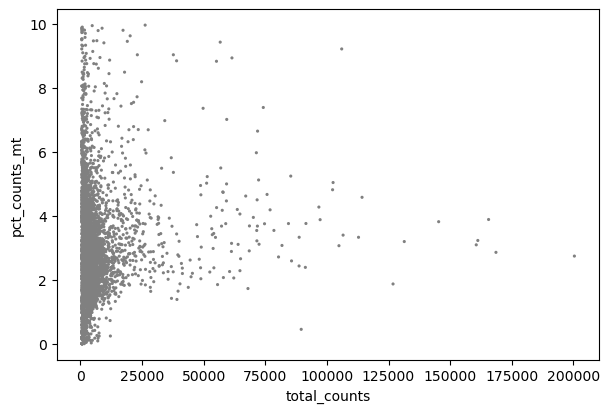

In [35]:
sc.pl.scatter(adata_combined, x="total_counts", y="pct_counts_mt")

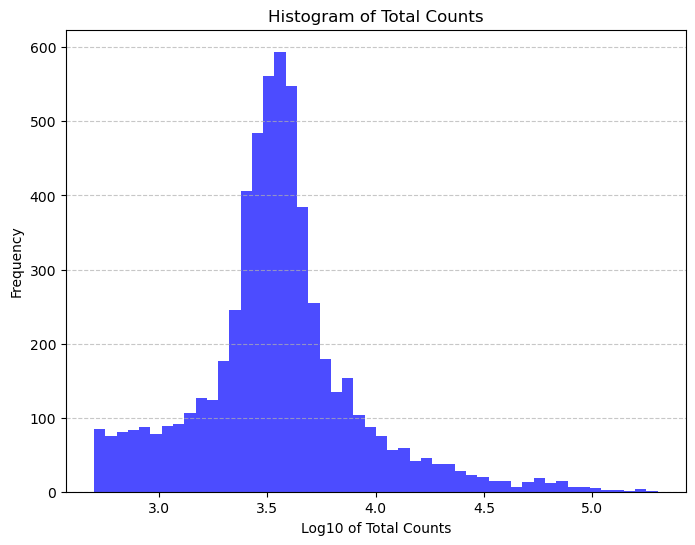

In [36]:
# plot histogram log10 of mt percentage
histogram_data = adata_combined.obs['total_counts'].copy()
histogram_data = histogram_data[~np.isnan(histogram_data)]  # Remove NaN
plt.figure(figsize=(8, 6))
plt.hist(np.log10(histogram_data + 1), bins=50, color='blue', alpha=0.7)
plt.xlabel('Log10 of Total Counts')
plt.ylabel('Frequency')
plt.title('Histogram of Total Counts')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

In [37]:
tcell_effector_genes = [
    # Cytotoxicity
    'GZMA', 'GZMB','GZMH','GZMK','PFN1','GNLY',
    
    # Activation
    'XCL1','XCL2','IL2RA','IFNG','TNF',
    
    # Stemness
    'IL7R','SELL',
    
    # Exhaustion
    'PDCD1','CTLA4','HAVCR2','LAG3','TIGIT','ENTPD1',
    # Proliferation
    'MKI67', 'TOP2A'
]

In [38]:
#setting up anndata for our regular scvi model
adata_combined.layers['counts'] = adata_combined.X.copy() # move count data into a layer
sc.pp.normalize_total(adata_combined, target_sum=1e4)
sc.pp.log1p(adata_combined)
sc.pp.highly_variable_genes(adata_combined, n_top_genes=5000, subset=False,)
adata_combined.raw = adata_combined

In [39]:
adata_combined.layers['normalized'] = adata_combined.X.copy()

In [40]:
#output hvg genes in csv 
adata_combined.var[adata_combined.var['highly_variable']].to_csv(f"{out_dir}/CD8_T_cells_hvg.csv")

In [41]:
# use only highly variable genes
adata_combined = adata_combined[:, adata_combined.var.highly_variable]

In [42]:
sc.pp.neighbors(adata_combined)
sc.tl.umap(adata_combined)

/home/user/anaconda3/lib/python3.12/site-packages/scanpy/neighbors/__init__.py:586: UserWarning: You’re trying to run this on 5000 dimensions of `.X`, if you really want this, set `use_rep='X'`.
         Falling back to preprocessing with `sc.pp.pca` and default params.
  X = _choose_representation(self._adata, use_rep=use_rep, n_pcs=n_pcs)


In [43]:
sc.tl.leiden(adata_combined,resolution=0.15)#,resolution=0.1,

/tmp/ipykernel_4067100/1796198498.py:1: FutureWarning: In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  directed must also be False to work with igraph's implementation.
  sc.tl.leiden(adata_combined,resolution=0.15)#,resolution=0.1,


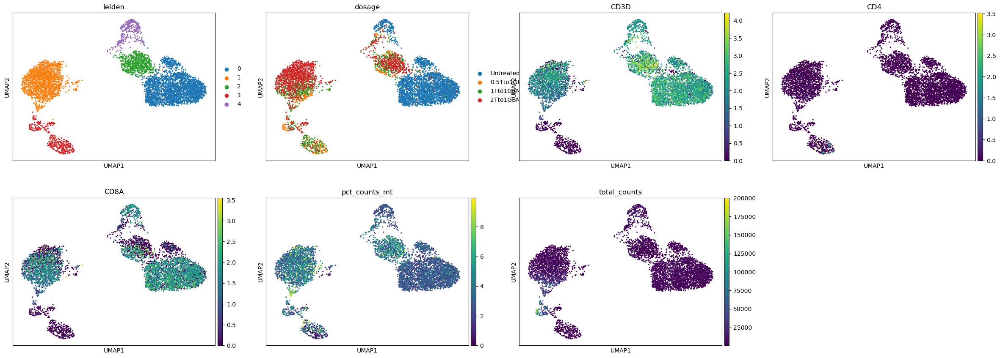

In [44]:
sc.pl.umap(adata_combined, color= ['leiden',"dosage","CD3D", 'CD4', 'CD8A',"pct_counts_mt",'total_counts'])

In [45]:
cluster_colors = sns.color_palette("Set2", adata_combined.obs['leiden'].nunique())

In [46]:
cluster_colors 

[(0.4, 0.7607843137254902, 0.6470588235294118),
 (0.9882352941176471, 0.5529411764705883, 0.3843137254901961),
 (0.5529411764705883, 0.6274509803921569, 0.796078431372549),
 (0.9058823529411765, 0.5411764705882353, 0.7647058823529411),
 (0.6509803921568628, 0.8470588235294118, 0.32941176470588235)]

In [47]:
# remove cluster 2 because of lack of T cell marker and they are proliferating
adata_combined = adata_combined[adata_combined.obs['leiden']!="3"]

In [48]:
sc.pp.neighbors(adata_combined)
sc.tl.umap(adata_combined)

In [49]:
adata_combined

AnnData object with n_obs × n_vars = 5463 × 5000
    obs: 'dose', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'dosage', 'n_genes', 'doublet_score', 'is_doublet', 'leiden'
    var: 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'dosage_colors', 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'leiden', 'leiden_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'counts', 'normalized'
    obsp: 'distances', 'connectivities'

2025-08-09 16:28:11,105 | WARNING : findfont: Font family 'Arial' not found.
2025-08-09 16:28:11,114 | WARNING : findfont: Font family 'Arial' not found.
2025-08-09 16:28:11,115 | WARNING : findfont: Font family 'Arial' not found.
2025-08-09 16:28:11,115 | WARNING : findfont: Font family 'Arial' not found.
2025-08-09 16:28:11,115 | WARNING : findfont: Font family 'Arial' not found.
2025-08-09 16:28:11,175 | WARNING : findfont: Font family 'Arial' not found.
2025-08-09 16:28:11,175 | WARNING : findfont: Font family 'Arial' not found.
2025-08-09 16:28:11,176 | WARNING : findfont: Font family 'Arial' not found.
2025-08-09 16:28:11,177 | WARNING : findfont: Font family 'Arial' not found.
2025-08-09 16:28:11,177 | WARNING : findfont: Font family 'Arial' not found.
2025-08-09 16:28:11,177 | WARNING : findfont: Font family 'Arial' not found.
2025-08-09 16:28:11,177 | WARNING : findfont: Font family 'Arial' not found.
2025-08-09 16:28:11,178 | WARNING : findfont: Font family 'Arial' not found.

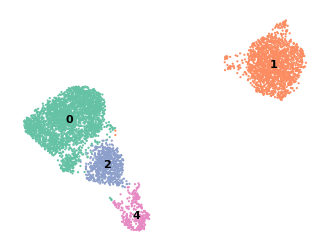

In [50]:

# Update your existing rcParams
mpl.rcParams.update({
    'font.size': 8,
    'svg.fonttype': 'none',
    'font.family': 'Arial',
    'figure.figsize': (4, 3)  # Set default figure size to 6×4 inches
})
mpl.rcParams['axes.titlesize'] = 8
mpl.rcParams['xtick.labelsize'] = 8  # Colorbar tick label size 
mpl.rcParams['ytick.labelsize'] = 8  # Colorbar tick label size


# Generate UMAP plot with larger dots
sc.pl.umap(
    adata_combined,
    color='leiden',
    legend_loc='on data',
    title='',
    palette=cluster_colors,
    frameon=False,
    size=10,  # Adjust this value to make the dots bigger (default is 120)
    show=False  # We will save it manually
)

# Save the plot manually with DPI 300
plt.savefig(f'{out_dir}/umap_clusters_dpi300.pdf', dpi=300, bbox_inches='tight', transparent = True)
plt.savefig(f'{out_dir}/umap_clusters_dpi300.png', dpi=300, bbox_inches='tight', transparent = True)
plt.savefig(f'{out_dir}/umap_clusters_dpi300.svg', dpi=300, bbox_inches='tight', transparent = True)
# Show the plot (optional, if you want to see it before saving)
plt.show()

/tmp/ipykernel_4067100/258244439.py:70: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax_main.scatter(umap_coords[mask, 0],
2025-08-09 16:28:15,017 | WARNING : findfont: Font family 'Arial' not found.
2025-08-09 16:28:15,018 | WARNING : findfont: Font family 'Arial' not found.
2025-08-09 16:28:15,020 | WARNING : findfont: Font family 'Arial' not found.
2025-08-09 16:28:15,021 | WARNING : findfont: Font family 'Arial' not found.
2025-08-09 16:28:15,022 | WARNING : findfont: Font family 'Arial' not found.
2025-08-09 16:28:15,027 | WARNING : findfont: Font family 'Arial' not found.
2025-08-09 16:28:15,027 | WARNING : findfont: Font family 'Arial' not found.
2025-08-09 16:28:15,028 | WARNING : findfont: Font 

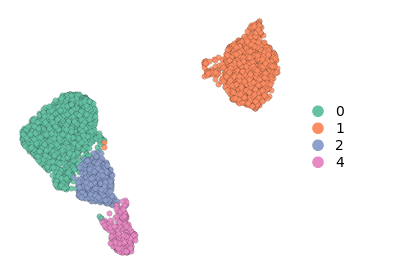

2025-08-09 16:28:15,236 | WARNING : findfont: Font family 'Arial' not found.
2025-08-09 16:28:15,236 | WARNING : findfont: Font family 'Arial' not found.
2025-08-09 16:28:15,237 | WARNING : findfont: Font family 'Arial' not found.
2025-08-09 16:28:15,238 | WARNING : findfont: Font family 'Arial' not found.
2025-08-09 16:28:15,238 | WARNING : findfont: Font family 'Arial' not found.
2025-08-09 16:28:15,242 | WARNING : findfont: Font family 'Arial' not found.
2025-08-09 16:28:15,242 | WARNING : findfont: Font family 'Arial' not found.
2025-08-09 16:28:15,243 | WARNING : findfont: Font family 'Arial' not found.
2025-08-09 16:28:15,243 | WARNING : findfont: Font family 'Arial' not found.
2025-08-09 16:28:15,243 | WARNING : findfont: Font family 'Arial' not found.
2025-08-09 16:28:15,280 | WARNING : findfont: Font family 'Arial' not found.
2025-08-09 16:28:15,280 | WARNING : findfont: Font family 'Arial' not found.
2025-08-09 16:28:15,281 | WARNING : findfont: Font family 'Arial' not found.

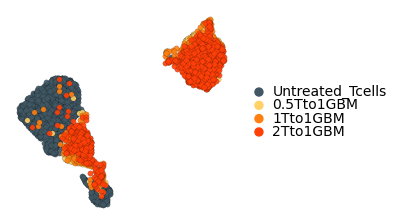

(<Figure size 400x300 with 2 Axes>, (<Axes: >, <Axes: >))

In [51]:


def plot_publication_umap(adata, cluster_key='leiden', figsize=(10, 8), colors=None, 
                         save=None, dpi=300, bbox_inches='tight', facecolor='white'):
    """
    Create publication-ready UMAP plot with exact styling from the image
    
    Parameters:
    -----------
    adata : AnnData object
        Annotated data object containing UMAP coordinates
    cluster_key : str, default 'leiden'
        Key in adata.obs containing cluster labels
    figsize : tuple, default (10, 8)
        Figure size (width, height)
    colors : list, dict, or None, default None
        Colors for clusters. Can be:
        - List of colors (hex codes, color names, etc.)
        - Dictionary mapping cluster labels to colors
        - None (uses default palette)
    save : str or None, default None
        Path to save the figure. If None, figure is only displayed.
        File format determined by extension (.pdf, .png, .svg, .eps, etc.)
    dpi : int, default 300
        Resolution for raster formats (png, jpg)
    bbox_inches : str, default 'tight'
        Bounding box in inches. 'tight' fits the figure tightly
    facecolor : str, default 'white'
        Background color of the saved figure
    """
    # Get data
    umap_coords = adata.obsm['X_umap']
    clusters = adata.obs[cluster_key].astype('category')
    
    # Handle different color input types
    if colors is None:
        # Default colors
        color_list = ['#87CEEB', '#1E90FF', '#90EE90', '#228B22', '#FFB6C1', '#DC143C']
    elif isinstance(colors, dict):
        # If colors is a dictionary, map cluster labels to colors
        color_list = []
        for cluster in clusters.cat.categories:
            if str(cluster) in colors:
                color_list.append(colors[str(cluster)])
            elif cluster in colors:
                color_list.append(colors[cluster])
            else:
                # Fallback color if cluster not in dictionary
                color_list.append('#808080')  # Gray
    else:
        # If colors is a list
        color_list = colors
    
    # Ensure we have enough colors for all clusters
    if len(color_list) < len(clusters.cat.categories):
        # Extend colors by cycling through the provided ones
        color_list = color_list * (len(clusters.cat.categories) // len(color_list) + 1)
    
    # Create figure with specific layout
    fig = plt.figure(figsize=figsize, facecolor='white')
    
    # Main plot area (left side)
    ax_main = plt.subplot2grid((1, 4), (0, 0), colspan=3)
    
    # Legend area (right side) - IMPORTANT: set equal aspect for circles
    ax_legend = plt.subplot2grid((1, 4), (0, 3))
    ax_legend.set_aspect('equal')  # This ensures circles stay circular
    
    # Plot clusters on main axis
    for i, cluster in enumerate(clusters.cat.categories):
        mask = clusters == cluster
        ax_main.scatter(umap_coords[mask, 0], 
                       umap_coords[mask, 1],
                       c=color_list[i],
                       s=15,
                       alpha=0.9,
                       edgecolors='black',
                       linewidth=0.1)
    
    # Style main plot
    ax_main.set_aspect('equal')
    ax_main.axis('off')
    ax_main.set_xlim(umap_coords[:, 0].min() - 1, umap_coords[:, 0].max() + 1)
    ax_main.set_ylim(umap_coords[:, 1].min() - 1, umap_coords[:, 1].max() + 1)
    
    # Create custom legend with perfect circles
    ax_legend.axis('off')
    ax_legend.set_xlim(0, 1)
    ax_legend.set_ylim(0, 1)
    
    # Add legend circles and labels
    y_positions = np.linspace(0.8, 0.2, len(clusters.cat.categories))
    
    for i, (cluster, y_pos) in enumerate(zip(clusters.cat.categories, y_positions)):
        # Draw circle using data coordinates
        circle = plt.Circle((0.2, y_pos), 0.06,
                          color=color_list[i], 
                          clip_on=False)
        ax_legend.add_patch(circle)
        
        # Keep all labels exactly as they are in your data
        label_text = str(cluster)
        
        ax_legend.text(0.4, y_pos, label_text, 
                      fontsize=10, va='center', ha='left')
    
    plt.tight_layout()
    
    # Save the plot if save path is provided
    if save is not None:
        plt.savefig(save, dpi=dpi, bbox_inches=bbox_inches, 
                   facecolor=facecolor, transparent=True)
    
    # Also save in multiple formats if you want (optional - remove if not needed)
    # These lines assume you have an 'out_dir' variable defined
    # Uncomment and modify if you want to save in multiple formats:
    plt.savefig(f'{out_dir}/umap_{cluster_key}_dpi300.pdf', dpi=300, bbox_inches='tight', transparent=True)
    plt.savefig(f'{out_dir}/umap_{cluster_key}_dpi300.png', dpi=300, bbox_inches='tight', transparent=True)
    plt.savefig(f'{out_dir}/umap_{cluster_key}_dpi300.svg', dpi=300, bbox_inches='tight', transparent=True)
    
    plt.show()
    
    return fig, (ax_main, ax_legend)

plot_publication_umap(adata_combined, cluster_key='leiden', figsize=(4, 3), colors=list(cluster_colors))
plot_publication_umap(adata_combined, cluster_key='dosage', figsize=(4, 3), colors= list(color_palette.values()))

/tmp/ipykernel_4067100/598268390.py:26: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
2025-08-09 16:28:19,440 | WARNING : findfont: Font family 'Arial' not found.
2025-08-09 16:28:19,441 | WARNING : findfont: Font family 'Arial' not found.
2025-08-09 16:28:19,441 | WARNING : findfont: Font family 'Arial' not found.
2025-08-09 16:28:19,442 | WARNING : findfont: Font family 'Arial' not found.
2025-08-09 16:28:19,491 | WARNING : findfont: Font family 'Arial' not found.
2025-08-09 16:28:19,492 | WARNING : findfont: Font family 'Arial' not found.
2025-08-09 16:28:19,492 | WARNING : findfont: Font family 'Arial' not found.
2025-08-09 16:28:19,492 | WARNING : findfont: Font family 'Arial' not found.
2025-08-09 16:28:19,494 | WARNING : findfont: Font family 'Arial' not found.
2025-08-09 16:28:19,540 | WARNING : findfont: Font family 'Arial' not found.
2025-08-09 16:28:19,542 | WARNING : findfont: Font famil

2025-08-09 16:28:23,643 | WARNING : findfont: Font family 'Arial' not found.
2025-08-09 16:28:23,643 | WARNING : findfont: Font family 'Arial' not found.
2025-08-09 16:28:23,644 | WARNING : findfont: Font family 'Arial' not found.
2025-08-09 16:28:23,644 | WARNING : findfont: Font family 'Arial' not found.
2025-08-09 16:28:23,651 | WARNING : findfont: Font family 'Arial' not found.
2025-08-09 16:28:23,653 | WARNING : findfont: Font family 'Arial' not found.
2025-08-09 16:28:23,653 | WARNING : findfont: Font family 'Arial' not found.
2025-08-09 16:28:23,653 | WARNING : findfont: Font family 'Arial' not found.
2025-08-09 16:28:23,653 | WARNING : findfont: Font family 'Arial' not found.
2025-08-09 16:28:23,654 | WARNING : findfont: Font family 'Arial' not found.
2025-08-09 16:28:23,654 | WARNING : findfont: Font family 'Arial' not found.
2025-08-09 16:28:23,654 | WARNING : findfont: Font family 'Arial' not found.
2025-08-09 16:28:23,655 | WARNING : findfont: Font family 'Arial' not found.

<Figure size 650x800 with 0 Axes>

2025-08-09 16:28:27,066 | WARNING : findfont: Font family 'Arial' not found.
2025-08-09 16:28:27,067 | WARNING : findfont: Font family 'Arial' not found.
2025-08-09 16:28:27,067 | WARNING : findfont: Font family 'Arial' not found.
2025-08-09 16:28:27,067 | WARNING : findfont: Font family 'Arial' not found.
2025-08-09 16:28:27,074 | WARNING : findfont: Font family 'Arial' not found.
2025-08-09 16:28:27,075 | WARNING : findfont: Font family 'Arial' not found.
2025-08-09 16:28:27,075 | WARNING : findfont: Font family 'Arial' not found.
2025-08-09 16:28:27,075 | WARNING : findfont: Font family 'Arial' not found.
2025-08-09 16:28:27,076 | WARNING : findfont: Font family 'Arial' not found.
2025-08-09 16:28:27,076 | WARNING : findfont: Font family 'Arial' not found.
2025-08-09 16:28:27,076 | WARNING : findfont: Font family 'Arial' not found.
2025-08-09 16:28:27,076 | WARNING : findfont: Font family 'Arial' not found.
2025-08-09 16:28:27,077 | WARNING : findfont: Font family 'Arial' not found.

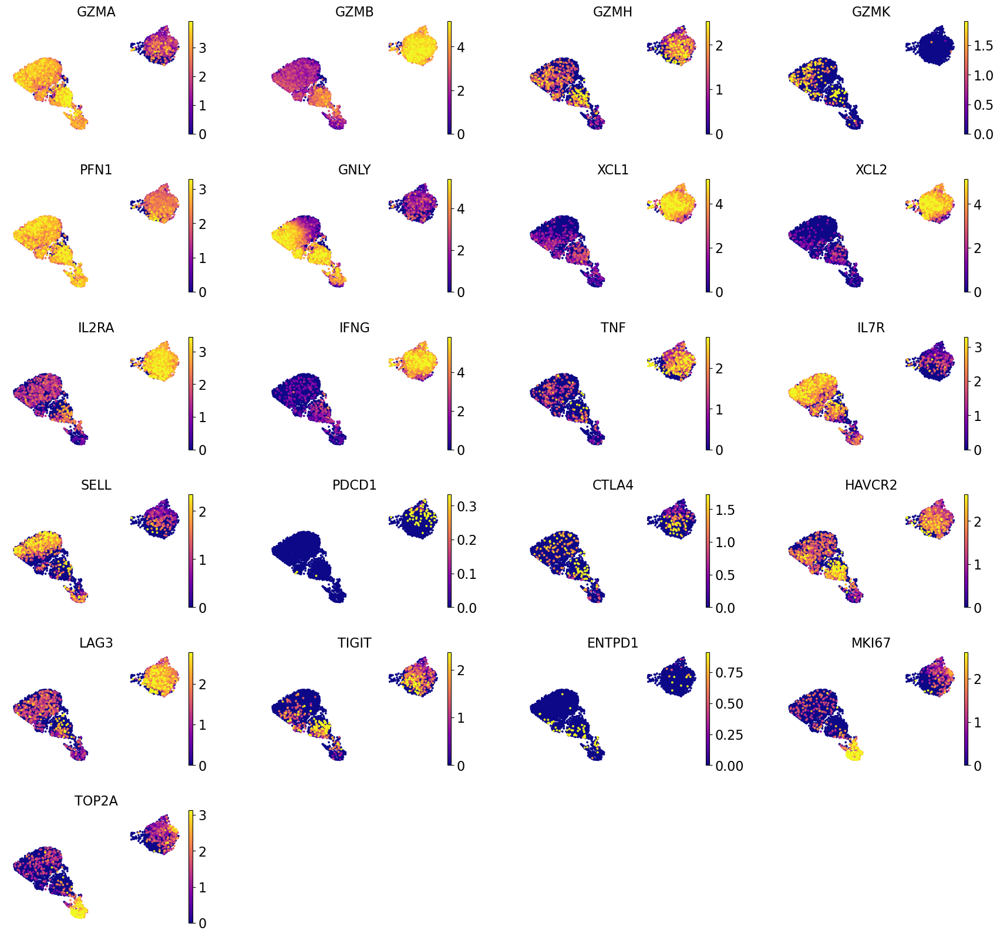

In [52]:

mpl.rcParams.update({
    'font.size': 16,
    'svg.fonttype': 'none',
    'font.family': 'Arial',
    'figure.figsize': (4, 3)  # Set default figure size to 6×4 inches
})
mpl.rcParams['axes.titlesize'] = 16
mpl.rcParams['xtick.labelsize'] = 16  # Colorbar tick label size 
mpl.rcParams['ytick.labelsize'] = 16 # Colorbar tick label size
plt.figure(figsize=(6.5, 8)) 
# Create the plot without individual colorbars
sc.pl.umap(adata_combined, 
           color=tcell_effector_genes,
           size=30,
           ncols=4,
           color_map='plasma',
           vmin='p1',
           vmax='p99',
           wspace=0.3,
           hspace=0.4,
           frameon=False,
           colorbar_loc='right',
           show=False)

# Add a single colorbar
plt.tight_layout()
plt.savefig(f'{out_dir}/tcell_effector_genes_dpi300.pdf', dpi=300, bbox_inches='tight', transparent = True)
plt.savefig(f'{out_dir}/tcell_effector_genes_dpi300.png', dpi=300, bbox_inches='tight', transparent = True)
plt.savefig(f'{out_dir}/tcell_effector_genes_dpi300.svg', dpi=300, bbox_inches='tight', transparent = True)
plt.show()


/tmp/ipykernel_4067100/2601250609.py:26: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
2025-08-09 17:18:06,090 | WARNING : findfont: Font family 'Arial' not found.
2025-08-09 17:18:06,090 | WARNING : findfont: Font family 'Arial' not found.
2025-08-09 17:18:06,091 | WARNING : findfont: Font family 'Arial' not found.
2025-08-09 17:18:06,091 | WARNING : findfont: Font family 'Arial' not found.
2025-08-09 17:18:06,094 | WARNING : findfont: Font family 'Arial' not found.
2025-08-09 17:18:06,095 | WARNING : findfont: Font family 'Arial' not found.
2025-08-09 17:18:06,095 | WARNING : findfont: Font family 'Arial' not found.
2025-08-09 17:18:06,096 | WARNING : findfont: Font family 'Arial' not found.
2025-08-09 17:18:06,103 | WARNING : findfont: Font family 'Arial' not found.
2025-08-09 17:18:06,113 | WARNING : findfont: Font family 'Arial' not found.
2025-08-09 17:18:06,124 | WARNING : findfont: Font fami

<Figure size 500x500 with 0 Axes>

2025-08-09 17:18:07,058 | WARNING : findfont: Font family 'Arial' not found.
2025-08-09 17:18:07,059 | WARNING : findfont: Font family 'Arial' not found.
2025-08-09 17:18:07,059 | WARNING : findfont: Font family 'Arial' not found.
2025-08-09 17:18:07,059 | WARNING : findfont: Font family 'Arial' not found.
2025-08-09 17:18:07,066 | WARNING : findfont: Font family 'Arial' not found.
2025-08-09 17:18:07,068 | WARNING : findfont: Font family 'Arial' not found.
2025-08-09 17:18:07,068 | WARNING : findfont: Font family 'Arial' not found.
2025-08-09 17:18:07,069 | WARNING : findfont: Font family 'Arial' not found.
2025-08-09 17:18:07,069 | WARNING : findfont: Font family 'Arial' not found.
2025-08-09 17:18:07,070 | WARNING : findfont: Font family 'Arial' not found.
2025-08-09 17:18:07,070 | WARNING : findfont: Font family 'Arial' not found.
2025-08-09 17:18:07,071 | WARNING : findfont: Font family 'Arial' not found.
2025-08-09 17:18:07,071 | WARNING : findfont: Font family 'Arial' not found.

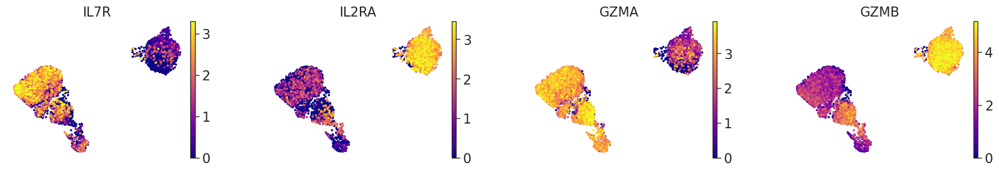

In [67]:
mpl.rcParams.update({
    'font.size': 16,
    'svg.fonttype': 'none',
    'font.family': 'Arial',
    'figure.figsize': (4, 3)  # Set default figure size to 6×4 inches
})
mpl.rcParams['axes.titlesize'] = 16
mpl.rcParams['xtick.labelsize'] = 16  # Colorbar tick label size 
mpl.rcParams['ytick.labelsize'] = 16 # Colorbar tick label size
plt.figure(figsize=(5, 5)) 
# Create the plot without individual colorbars
sc.pl.umap(adata_combined, 
           color=['IL7R', 'IL2RA','GZMA','GZMB'],
           size=30,
           ncols=4,
           color_map='plasma',
           vmin='p1',
           vmax='p99',
           wspace=0.3,
           hspace=0.4,
           frameon=False,
           colorbar_loc='right',
           show=False)

# Add a single colorbar
plt.tight_layout()
plt.savefig(f'{out_dir}/4_genes_dpi300.pdf', dpi=300, bbox_inches='tight', transparent = True)
plt.savefig(f'{out_dir}/4_genes_dpi300.png', dpi=300, bbox_inches='tight', transparent = True)
plt.savefig(f'{out_dir}/4_genes_dpi300.svg', dpi=300, bbox_inches='tight', transparent = True)
plt.show()

In [53]:

mpl.rcParams.update({
    'font.size': 8,
    'svg.fonttype': 'none',
    'font.family': 'Arial',
    'figure.figsize': (4, 3)  # Set default figure size to 6×4 inches
})
mpl.rcParams['axes.titlesize'] = 8
mpl.rcParams['xtick.labelsize'] = 8  # Colorbar tick label size 
mpl.rcParams['ytick.labelsize'] = 8 # Colorbar tick label size

def plot_leiden_proportions_method(adata_combined, dosage_col='dosage', leiden_col='leiden', 
                                 save_fig=False, filename="leiden_proportions_by_dosage", 
                                 figsize=(2.8, 2.2), dpi=300, out_dir=out_dir):
    """
    Plot proportion of Leiden clusters for each dosage using pandas crosstab
    
    Parameters:
    -----------
    adata_combined : AnnData object
        Your single cell data
    dosage_col : str
        Column name for dosage information
    leiden_col : str
        Column name for leiden clusters
    save_fig : bool
        Whether to save the figure
    filename : str
        Base filename for saving (without extension)
    figsize : tuple
        Figure size (width, height)
    dpi : int
        Resolution for saving
    out_dir : str
        Output directory for saving figures
    
    Returns:
    --------
    ct : pandas.DataFrame
        Crosstab with proportions
    """
    # Create a DataFrame with the relevant columns
    df = pd.DataFrame({
        'dosage': adata_combined.obs[dosage_col],
        'leiden': adata_combined.obs[leiden_col]
    })
    
    # Create crosstab and normalize to get proportions
    ct = pd.crosstab(df['dosage'], df['leiden'], normalize='index')
    
    # Get the number of clusters and use only the first 4 Set2 colors
    n_clusters = len(ct.columns)
    cluster_colors = sns.color_palette("Set2", 4)  # Get only first 4 colors
    
    # If you have more than 4 clusters, you might want to repeat or extend
    if n_clusters > 4:
        cluster_colors = (cluster_colors * ((n_clusters // 4) + 1))[:n_clusters]
    else:
        cluster_colors = cluster_colors[:n_clusters]
    
    # Create the plot
    fig, ax = plt.subplots(figsize=figsize)
    
    # Create stacked bar plot using the specific colors
    ct.plot(kind='bar', stacked=True, ax=ax, 
            color=cluster_colors, width=0.8)  # Use color instead of colormap
    
    ax.set_xlabel('Dosage')  # Move x-label left/up
    ax.set_ylabel('Frequency')
    ax.set_title('Proportion of Leiden Clusters by Dosage')
    ax.legend(title='Cluster', bbox_to_anchor=(1.05, 1), loc='upper left', frameon=False)
    ax.set_xticklabels(ax.get_xticklabels(), rotation=30, ha= 'right')
    
    plt.tight_layout()
    
    # Save figures if requested
    
    if save_fig:
        fig.savefig(f"{out_dir}/{filename}.png", bbox_inches='tight', dpi=dpi)
        fig.savefig(f"{out_dir}/{filename}.pdf", bbox_inches='tight', dpi=dpi)
        fig.savefig(f"{out_dir}/{filename}.svg", bbox_inches='tight', dpi=dpi)
        print(f"Figures saved as {filename}.png, {filename}.pdf, and {filename}.svg")
        
        plt.show()
        plt.close(fig)  # Close the figure to free up memory
    else:
        plt.show()
    
    return ct

2025-08-09 16:28:27,387 | WARNING : findfont: Font family 'Arial' not found.
2025-08-09 16:28:27,388 | WARNING : findfont: Font family 'Arial' not found.
2025-08-09 16:28:27,389 | WARNING : findfont: Font family 'Arial' not found.
2025-08-09 16:28:27,389 | WARNING : findfont: Font family 'Arial' not found.
2025-08-09 16:28:27,389 | WARNING : findfont: Font family 'Arial' not found.
2025-08-09 16:28:27,390 | WARNING : findfont: Font family 'Arial' not found.
2025-08-09 16:28:27,390 | WARNING : findfont: Font family 'Arial' not found.
2025-08-09 16:28:27,392 | WARNING : findfont: Font family 'Arial' not found.
2025-08-09 16:28:27,392 | WARNING : findfont: Font family 'Arial' not found.
2025-08-09 16:28:27,392 | WARNING : findfont: Font family 'Arial' not found.
2025-08-09 16:28:27,392 | WARNING : findfont: Font family 'Arial' not found.
2025-08-09 16:28:27,393 | WARNING : findfont: Font family 'Arial' not found.
2025-08-09 16:28:27,393 | WARNING : findfont: Font family 'Arial' not found.

Figures saved as leiden_proportions_by_dosage.png, leiden_proportions_by_dosage.pdf, and leiden_proportions_by_dosage.svg


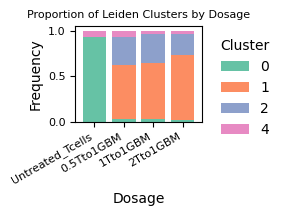

leiden,0,1,2,4
dosage,,,,
Untreated_Tcells,0.930124,0.000334,0.000334,0.069208
0.5Tto1GBM,0.030303,0.598485,0.303030,0.068182
1Tto1GBM,0.025840,0.625323,0.310078,0.038760
2Tto1GBM,0.014644,0.722455,0.228033,0.034868


In [54]:
# Simple versionadata_combined
plot_leiden_proportions_method(adata_combined, save_fig=True, out_dir= out_dir)

In [55]:
sc.tl.rank_genes_groups(adata_combined, groupby='dosage', use_raw=False, method='wilcoxon')
degs_df = sc.get.rank_genes_groups_df(adata_combined, group=None)
degs_df.to_csv(f"{out_dir}/degs_T_cell_dosage.csv", index=False)

In [56]:
#get degs_df tha contains tcell_effector_genes
tcell_effector_genes = set(tcell_effector_genes)
degs_df['is_tcell_effector'] = degs_df['names'].isin(tcell_effector_genes)
tcell_effector_degs = degs_df[degs_df['is_tcell_effector']]
# filter for p-value < 0.05 and log fold change > 0.5
tcell_effector_degs = tcell_effector_degs[(tcell_effector_degs['pvals_adj'] < 0.05) & (tcell_effector_degs['logfoldchanges'].abs() > 0.5)]
tcell_effector_degs

,group,names,scores,logfoldchanges,pvals,pvals_adj,is_tcell_effector
16,Untreated_Tcells,GZMA,32.213554,2.147237,1.140169e-227,1.096317e-225,True
24,Untreated_Tcells,IL7R,26.927906,2.752783,1.035263e-159,6.810942e-158,True
34,Untreated_Tcells,GNLY,20.751915,1.900456,1.178045e-95,5.403876e-94,True
4839,Untreated_Tcells,TIGIT,-12.186787,-2.707401,3.655539e-34,8.123419e-33,True
4840,Untreated_Tcells,GZMH,-12.200212,-1.541813,3.100146e-34,6.919969e-33,True
4878,Untreated_Tcells,TNF,-15.234496,-2.744033,2.087316e-52,5.998034e-51,True
4888,Untreated_Tcells,HAVCR2,-16.083010,-1.711187,3.356663e-58,1.029651e-56,True
4943,Untreated_Tcells,LAG3,-25.411549,-2.707491,1.879793e-142,1.118924e-140,True
4982,Untreated_Tcells,IL2RA,-38.338444,-3.903703,0.000000e+00,0.000000e+00,True
4986,Untreated_Tcells,XCL2,-39.996666,-7.321089,0.000000e+00,0.000000e+00,True


In [57]:
tcell_effector_degs

,group,names,scores,logfoldchanges,pvals,pvals_adj,is_tcell_effector
16,Untreated_Tcells,GZMA,32.213554,2.147237,1.140169e-227,1.096317e-225,True
24,Untreated_Tcells,IL7R,26.927906,2.752783,1.035263e-159,6.810942e-158,True
34,Untreated_Tcells,GNLY,20.751915,1.900456,1.178045e-95,5.403876e-94,True
4839,Untreated_Tcells,TIGIT,-12.186787,-2.707401,3.655539e-34,8.123419e-33,True
4840,Untreated_Tcells,GZMH,-12.200212,-1.541813,3.100146e-34,6.919969e-33,True
4878,Untreated_Tcells,TNF,-15.234496,-2.744033,2.087316e-52,5.998034e-51,True
4888,Untreated_Tcells,HAVCR2,-16.083010,-1.711187,3.356663e-58,1.029651e-56,True
4943,Untreated_Tcells,LAG3,-25.411549,-2.707491,1.879793e-142,1.118924e-140,True
4982,Untreated_Tcells,IL2RA,-38.338444,-3.903703,0.000000e+00,0.000000e+00,True
4986,Untreated_Tcells,XCL2,-39.996666,-7.321089,0.000000e+00,0.000000e+00,True


In [58]:
sc.tl.rank_genes_groups(adata_combined, groupby='leiden', use_raw=False, method='wilcoxon')
degs_df = sc.get.rank_genes_groups_df(adata_combined, group=None)
degs_df.to_csv(f"{out_dir}/degs_T_cell_cluster.csv", index=False)

#get degs_df tha contains tcell_effector_genes
tcell_effector_genes = set(tcell_effector_genes)
degs_df['is_tcell_effector'] = degs_df['names'].isin(tcell_effector_genes)
tcell_effector_degs = degs_df[degs_df['is_tcell_effector']]
tcell_effector_degs = tcell_effector_degs[(tcell_effector_degs['pvals_adj'] < 0.05) & (tcell_effector_degs['logfoldchanges'].abs() > 0.5)]
tcell_effector_degs 

,group,names,scores,logfoldchanges,pvals,pvals_adj,is_tcell_effector
16,0,GZMA,29.185936,1.910870,2.925141e-187,2.321540e-185,True
20,0,IL7R,26.425287,2.662003,7.019336e-154,4.874539e-152,True
32,0,GNLY,20.412304,1.873299,1.300105e-92,6.019003e-91,True
138,0,GZMK,2.802127,1.703425,5.076691e-03,4.316914e-02,True
4820,0,GZMH,-11.396541,-1.408401,4.350630e-30,9.063813e-29,True
4823,0,MKI67,-11.522375,-2.740736,1.017670e-30,2.146983e-29,True
4825,0,TIGIT,-11.535912,-2.557193,8.696086e-31,1.850231e-29,True
4856,0,TNF,-14.475478,-2.634773,1.731183e-47,4.461812e-46,True
4863,0,TOP2A,-14.743918,-2.765119,3.366703e-49,9.050277e-48,True
4870,0,HAVCR2,-15.112440,-1.571160,1.340806e-51,3.787587e-50,True


In [59]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.ndimage import gaussian_filter1d
from sklearn.preprocessing import StandardScaler

def plot_pseudotime_heatmap(adata, genes, time_key, category_keys=None, 
                           category_colors=None, n_bins=100, smooth=True, 
                           smooth_sigma=2.0, scale=True, cluster_genes=False, 
                           figsize=None, cmap='viridis', bar_height=0.05,
                           square_cells=True, genes_of_interest=None):
    """
    Plot a heatmap of gene expression along pseudotime with multiple category bars.
    
    Parameters
    ----------
    adata : AnnData
        Annotated data object
    genes : list
        List of gene names to plot
    time_key : str
        Key in adata.obs containing pseudotime values
    category_keys : str or list, optional
        Key(s) in adata.obs for categorical annotation bars above heatmap.
        Can be a single string or list of strings for multiple bars.
    category_colors : dict or list of dict, optional
        Color mapping for categories. If category_keys is a list, this should be
        a list of dicts with format {category_value: color}. If single category_key,
        can be a single dict. If None, uses default colors.
    n_bins : int, default 100
        Number of pseudotime bins
    smooth : bool, default True
        Whether to smooth expression values
    smooth_sigma : float, default 2.0
        Smoothing strength (higher = more smooth). Use 1.0 for light smoothing,
        2.0-3.0 for moderate smoothing, 4.0+ for heavy smoothing
    scale : bool, default True
        Whether to scale expression values (0-1)
    cluster_genes : bool, default False
        Whether to cluster genes (if False, preserves input gene order)
    figsize : tuple, optional
        Figure size. If None, automatically calculated for square cells
    square_cells : bool, default True
        Whether to make heatmap cells approximately square
    cmap : str, default 'viridis'
        Colormap to use for heatmap
    show_pseudotime_bar : bool, default False
        Whether to show a pseudotime gradient bar above the heatmap
    pseudotime_cmap : str, default 'plasma'
        Colormap to use for pseudotime bar
        
    Returns
    -------
    fig : matplotlib.figure.Figure
        The figure object
    """
    
    # Validate genes
    valid_genes = [g for g in genes if g in adata.var_names]
    if not valid_genes:
        raise ValueError("No valid genes found in adata")
    if len(valid_genes) < len(genes):
        missing = set(genes) - set(valid_genes)
        print(f"Warning: Missing genes: {missing}")
    
    # Validate pseudotime
    if time_key not in adata.obs.columns:
        raise ValueError(f"Pseudotime key '{time_key}' not found in adata.obs")
    
    # Handle category keys
    if category_keys is not None:
        if isinstance(category_keys, str):
            category_keys = [category_keys]
        
        # Validate category keys
        invalid_keys = [k for k in category_keys if k not in adata.obs.columns]
        if invalid_keys:
            raise ValueError(f"Category keys not found in adata.obs: {invalid_keys}")
    
    # Handle category colors
    if category_colors is not None:
        if isinstance(category_keys, list) and len(category_keys) > 1:
            if not isinstance(category_colors, list):
                category_colors = [category_colors]
            if len(category_colors) != len(category_keys):
                raise ValueError("Number of category_colors must match number of category_keys")
        elif isinstance(category_colors, list) and len(category_keys) == 1:
            category_colors = category_colors[0]
    
    # Extract data
    pseudotime = adata.obs[time_key].values
    gene_expr = adata[:, valid_genes].X
    
    # Convert sparse to dense if needed
    if hasattr(gene_expr, 'toarray'):
        gene_expr = gene_expr.toarray()
    
    # Remove cells with missing pseudotime
    valid_mask = ~np.isnan(pseudotime)
    pseudotime = pseudotime[valid_mask]
    gene_expr = gene_expr[valid_mask, :]
    valid_adata = adata[valid_mask]
    
    # Create pseudotime bins
    time_bins = np.linspace(pseudotime.min(), pseudotime.max(), n_bins)
    bin_centers = (time_bins[:-1] + time_bins[1:]) / 2
    
    # Bin the expression data
    binned_expr = np.zeros((len(valid_genes), len(bin_centers)))
    bin_categories = {key: [] for key in (category_keys or [])}
    
    for i, time_point in enumerate(bin_centers):
        # Find cells in this bin
        bin_start = time_bins[i]
        bin_end = time_bins[i + 1]
        mask = (pseudotime >= bin_start) & (pseudotime < bin_end)
        
        if np.sum(mask) > 0:
            # Average expression in this bin
            binned_expr[:, i] = np.mean(gene_expr[mask, :], axis=0)
            
            # Get categories for this bin
            if category_keys:
                for key in category_keys:
                    bin_cats = valid_adata.obs.loc[mask, key]
                    # Use most common category in bin
                    most_common = bin_cats.mode().iloc[0] if len(bin_cats) > 0 else 'Unknown'
                    bin_categories[key].append(most_common)
        else:
            # Use nearest neighbor if no cells in bin
            nearest_idx = np.argmin(np.abs(pseudotime - time_point))
            binned_expr[:, i] = gene_expr[nearest_idx, :]
            if category_keys:
                for key in category_keys:
                    bin_categories[key].append(valid_adata.obs.iloc[nearest_idx][key])
    
    # Smooth expression if requested
    if smooth:
        binned_expr = gaussian_filter1d(binned_expr, sigma=smooth_sigma, axis=1)
    
    # Scale expression if requested
    if scale:
        binned_expr = np.array([
            (row - row.min()) / (row.max() - row.min()) if row.max() > row.min() else row
            for row in binned_expr
        ])
    
    # Create DataFrame - preserve gene order from input
    df = pd.DataFrame(binned_expr, index=valid_genes, columns=bin_centers)
    
    # Reorder to match input gene order (in case some genes were missing)
    ordered_genes = [g for g in genes if g in valid_genes]
    df = df.loc[ordered_genes]
    
    # Debug print to check gene order
    print(f"Ordered genes (first 10): {ordered_genes[:10]}")
    print(f"DataFrame index (first 10): {list(df.index)[:10]}")
    if genes_of_interest:
        print(f"Genes of interest: {genes_of_interest}")
        for gene in genes_of_interest:
            if gene in ordered_genes:
                print(f"{gene} is at position {ordered_genes.index(gene)} in ordered_genes")
    
    # Calculate figure size for square cells if not provided
    if figsize is None and square_cells:
        # Base calculations for square aspect
        n_genes = len(ordered_genes)
        n_time_points = len(bin_centers)
        
        # Calculate dimensions to make cells roughly square
        cell_size = 0.02  # Size per cell in inches
        width = max(8, n_time_points * cell_size)
        height = max(4, n_genes * cell_size)
        
        # Add space for category bars
        n_total_bars = len(category_keys) if category_keys else 0
        if n_total_bars > 0:
            height += n_total_bars * 0.2  # Reduced space for thinner bars
        
        figsize = (width, height)
    elif figsize is None:
        figsize = (12, 8)  # Default fallback
    
    # Create color mappings for categories
    col_colors_list = []
    legends_info = []
    
    if category_keys:
        for i, key in enumerate(category_keys):
            unique_cats = list(set(bin_categories[key]))
            
            # Use provided colors or generate default colors
            if category_colors and isinstance(category_colors, list):
                color_map = category_colors[i] if i < len(category_colors) else {}
            elif category_colors and not isinstance(category_colors, list):
                color_map = category_colors
            else:
                color_map = {}
            
            # Generate colors for missing categories
            default_colors = plt.cm.Set3(np.linspace(0, 1, len(unique_cats)))
            for j, cat in enumerate(unique_cats):
                if cat not in color_map:
                    color_map[cat] = default_colors[j]
            
            # Create color array for this category
            cat_colors = [color_map[cat] for cat in bin_categories[key]]
            col_colors_list.append(cat_colors)
            legends_info.append((key, color_map))
    
    # Determine subplot structure
    n_cat_bars = len(category_keys) if category_keys else 0
    
    if n_cat_bars > 0:
        height_ratios = [bar_height] * n_cat_bars + [1.0]
        fig, axes = plt.subplots(n_cat_bars + 1, 1, figsize=figsize, 
                                gridspec_kw={'height_ratios': height_ratios,
                                           'hspace': 0.0})  # No space between plots
        if n_cat_bars == 1:
            axes = [axes[0], axes[1]]  # Ensure it's always a list
        
        # Plot category bars
        for i, (cat_key, cat_colors) in enumerate(zip(category_keys, col_colors_list)):
            ax_cat = axes[i]
            
            # Convert colors to RGB values for imshow
            from matplotlib.colors import to_rgba
            cat_colors_rgba = [to_rgba(color) for color in cat_colors]
            cat_array = np.array(cat_colors_rgba).reshape(1, -1, 4)  # RGBA format
            
            # Use same extent as heatmap for perfect alignment
            ax_cat.imshow(cat_array, aspect='auto', extent=[0, len(bin_centers), 0, 1])
            ax_cat.set_xlim(0, len(bin_centers))
            ax_cat.set_xticks([])
            ax_cat.set_yticks([])
            ax_cat.set_ylabel(cat_key, rotation=0, ha='right', va='center', fontsize=10)
            
            # Remove spines
            for spine in ax_cat.spines.values():
                spine.set_visible(False)
        
        # Plot heatmap
        ax_heat = axes[-1]
        
        if cluster_genes and len(valid_genes) > 1:
            # For clustering, we need to use clustermap which creates its own figure
            # So we'll create the clustermap separately and copy it
            g = sns.clustermap(
                df, 
                cmap=cmap, 
                figsize=(figsize[0], figsize[1] * 0.7),  # Adjust height for category bars
                row_cluster=True,
                col_cluster=False,
                xticklabels=False,
                cbar_pos=(0.92, 0.2, 0.02, 0.6)  # Thinner colorbar: (x, y, width, height)
            )
            
            # We'll use the clustered order but plot on our main figure
            clustered_df = df.iloc[g.dendrogram_row.reordered_ind]
            im = ax_heat.imshow(clustered_df.values, cmap=cmap, aspect='auto')
            ax_heat.set_yticks(range(len(clustered_df.index)))
            ax_heat.set_yticklabels(clustered_df.index)
            
            # Add colorbar aligned with heatmap for clustered version - positioned close
            cbar_ax = fig.add_axes([0.91, ax_heat.get_position().y0, 0.015, ax_heat.get_position().height])  # Closer and thinner
            plt.colorbar(im, cax=cbar_ax)
            
            plt.close(g.fig)  # Close the clustermap figure
        else:
            im = ax_heat.imshow(df.values, cmap=cmap, aspect='auto', extent=[0, len(bin_centers), 0, len(ordered_genes)])
            
            # Set gene labels based on genes_of_interest  
            if genes_of_interest is not None:
                if len(genes_of_interest) == 0:
                    # No labels
                    ax_heat.set_yticks([])
                    ax_heat.set_yticklabels([])
                else:
                    # Only show labels for genes of interest
                    gene_positions = []
                    gene_labels = []
                    for gene in genes_of_interest:
                        if gene in df.index:
                            # Get position in DataFrame (which should match visual order)
                            pos = list(df.index).index(gene)
                            # Since imshow shows first row at top, position 0 is at top
                            # Y-axis goes from 0 (bottom) to len(genes) (top)
                            # So we need to flip: visual_pos = len(genes) - 1 - dataframe_pos
                            visual_pos = len(df.index) - 1 - pos
                            gene_positions.append(visual_pos + 0.5)
                            gene_labels.append(gene)
                    ax_heat.set_yticks(gene_positions)
                    ax_heat.set_yticklabels(gene_labels)
            else:
                # Show all gene labels (flipped for imshow)
                positions = np.arange(len(df.index)) + 0.5
                labels = list(df.index)[::-1]  # Reverse for imshow
                ax_heat.set_yticks(positions)
                ax_heat.set_yticklabels(labels)
            
            # FIXED: Add colorbar aligned with heatmap axes - positioned close to heatmap
            # Get the exact position of the heatmap axes
            pos = ax_heat.get_position()
            # Create colorbar axes with same height and y-position as heatmap, positioned close
            cbar_ax = fig.add_axes([pos.x1 + 0.01, pos.y0, 0.015, pos.height])  # Closer and thinner
            cbar = plt.colorbar(im, cax=cbar_ax)
            cbar.set_label('Scaled Expression' if scale else 'Expression', rotation=270, labelpad=15)
        
        # Customize heatmap
        ax_heat.set_xlabel(f'{time_key}')
        ax_heat.set_ylabel('Genes')
        
        # Set x-axis ticks to align with heatmap
        n_ticks = 8
        tick_positions = np.linspace(0, len(bin_centers), n_ticks)
        ax_heat.set_xticks(tick_positions)
        tick_labels = []
        for i in range(n_ticks):
            if i == n_ticks - 1:
                tick_labels.append(f'{bin_centers[-1]:.2f}')
            else:
                idx = int(i * (len(bin_centers) - 1) / (n_ticks - 1))
                tick_labels.append(f'{bin_centers[idx]:.2f}')
        ax_heat.set_xticklabels(tick_labels)
        
        # Plot the heatmap and colorbar first, then add legends
        # This ensures proper rendering order
        fig.canvas.draw_idle()  # Force drawing of heatmap and colorbar
        
        # Add legends for categories - positioned further out after colorbar
        legend_x_start = pos.x1 + 0.06  # Further out to account for closer colorbar
        for i, (cat_key, color_map) in enumerate(legends_info):
            from matplotlib.patches import Patch
            legend_elements = [Patch(facecolor=color, label=cat) 
                             for cat, color in color_map.items()]
            ax_heat.legend(handles=legend_elements, 
                          title=cat_key,
                          bbox_to_anchor=(legend_x_start + i*0.15, 1), 
                          loc='upper left', frameon=False)
    
    else:
        # No category bars, simple heatmap
        fig, ax_heat = plt.subplots(figsize=figsize)
        
        if cluster_genes and len(valid_genes) > 1:
            g = sns.clustermap(
                df, 
                cmap=cmap, 
                figsize=figsize,
                row_cluster=True,
                col_cluster=False,
                xticklabels=False
            )
            return g.fig
        else:
            sns.heatmap(df, cmap=cmap, ax=ax_heat, xticklabels=False, cbar=True)
        
        ax_heat.set_xlabel(f'{time_key}')
        ax_heat.set_ylabel('Genes')
        
        # Set x-axis ticks
        n_ticks = 8
        tick_positions = np.linspace(0, len(bin_centers), n_ticks)
        ax_heat.set_xticks(tick_positions)
        tick_labels = []
        for i in range(n_ticks):
            if i == n_ticks - 1:
                tick_labels.append(f'{bin_centers[-1]:.2f}')
            else:
                idx = int(i * (len(bin_centers) - 1) / (n_ticks - 1))
                tick_labels.append(f'{bin_centers[idx]:.2f}')
        ax_heat.set_xticklabels(tick_labels)
        
        # Add category legend(s) - draw after heatmap for proper layering
        if category_keys and legends_info:
            # Force drawing of heatmap first
            fig.canvas.draw_idle()
            
            legend_x_start = 1.25  # Start legends after the colorbar
            for i, (cat_key, color_map) in enumerate(legends_info):
                from matplotlib.patches import Patch
                legend_elements = [Patch(facecolor=color, label=cat) 
                                 for cat, color in color_map.items()]
                ax_heat.legend(handles=legend_elements, 
                              title=cat_key,
                              bbox_to_anchor=(legend_x_start + i*0.15, 1), 
                              loc='upper left',
                              frameon=True,
                              fancybox=True,
                              shadow=True)
    
    plt.tight_layout()
    return fig

# Example usage:
"""
# Only show specific genes of interest
genes_to_label = ['SMAD9', 'DCC', 'TNFRSF12A']
fig = plot_pseudotime_heatmap(adata, genes, 'dpt_pseudotime',
                             category_keys=['cell_type'],
                             category_colors=[cell_colors],
                             genes_of_interest=genes_to_label,
                             bar_height=0.05)  # Very thin bars

# No gene labels (clean look)
fig = plot_pseudotime_heatmap(adata, genes, 'dpt_pseudotime',
                             genes_of_interest=[])  # Empty list = no labels

plt.show()
"""

"\n# Only show specific genes of interest\ngenes_to_label = ['SMAD9', 'DCC', 'TNFRSF12A']\nfig = plot_pseudotime_heatmap(adata, genes, 'dpt_pseudotime',\n                             category_keys=['cell_type'],\n                             category_colors=[cell_colors],\n                             genes_of_interest=genes_to_label,\n                             bar_height=0.05)  # Very thin bars\n\n# No gene labels (clean look)\nfig = plot_pseudotime_heatmap(adata, genes, 'dpt_pseudotime',\n                             genes_of_interest=[])  # Empty list = no labels\n\nplt.show()\n"

In [60]:
colors = {'0.0' : '#023047','0.25':'#219EBC','0.5':'#FFD166','1.0' : '#FF7F11'}

2025-08-09 16:28:28,247 | INFO : Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
2025-08-09 16:28:28,250 | INFO : Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
2025-08-09 16:28:28,251 | INFO : Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
2025-08-09 16:28:28,298 | INFO : Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
2025-08-09 16:28:28,302 | INFO : Using categorical units to plot a list of strings that are all parsable as 

2025-08-09 16:28:28,384 | INFO : Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
2025-08-09 16:28:28,387 | INFO : Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
2025-08-09 16:28:28,388 | INFO : Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
2025-08-09 16:28:28,396 | INFO : Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
2025-08-09 16:28:28,400 | INFO : Using categorical units to plot a list of strings that are all parsable as 

2025-08-09 16:28:28,522 | WARNING : findfont: Font family 'Arial' not found.
2025-08-09 16:28:28,522 | WARNING : findfont: Font family 'Arial' not found.
2025-08-09 16:28:28,522 | WARNING : findfont: Font family 'Arial' not found.
2025-08-09 16:28:28,523 | WARNING : findfont: Font family 'Arial' not found.
2025-08-09 16:28:28,523 | WARNING : findfont: Font family 'Arial' not found.
2025-08-09 16:28:28,524 | WARNING : findfont: Font family 'Arial' not found.
2025-08-09 16:28:28,524 | WARNING : findfont: Font family 'Arial' not found.
2025-08-09 16:28:28,525 | WARNING : findfont: Font family 'Arial' not found.
2025-08-09 16:28:28,525 | WARNING : findfont: Font family 'Arial' not found.
2025-08-09 16:28:28,527 | WARNING : findfont: Font family 'Arial' not found.
2025-08-09 16:28:28,533 | WARNING : findfont: Font family 'Arial' not found.
2025-08-09 16:28:28,535 | WARNING : findfont: Font family 'Arial' not found.
2025-08-09 16:28:28,543 | WARNING : findfont: Font family 'Arial' not found.

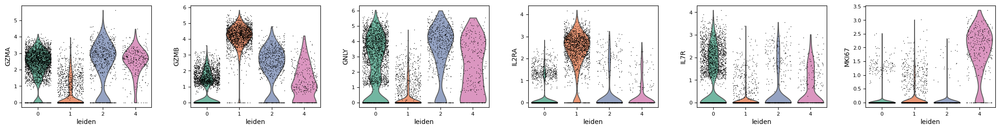

In [61]:

sc.pl.violin(
    adata_combined,
    ['GZMA', 'GZMB','GNLY','IL2RA','IL7R','MKI67'],
    groupby='leiden',
    jitter=0.4,
    multi_panel=True,
    save='_tcell_violin_dosage.png'
)

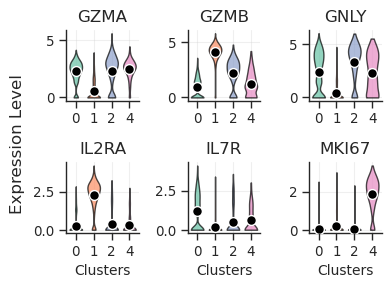

In [62]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# First, prepare your data from adata_combined
genes = ['GZMA', 'GZMB', 'GNLY', 'IL2RA', 'IL7R', 'MKI67']

# Convert scanpy data to pandas DataFrame in long format
plot_data = []
for gene in genes:
    # Extract expression data for the gene
    if hasattr(adata_combined[:, gene].X, 'toarray'):
        # If sparse matrix
        expression_values = adata_combined[:, gene].X.toarray().flatten()
    else:
        # If dense matrix
        expression_values = adata_combined[:, gene].X.flatten()
    
    gene_data = pd.DataFrame({
        'expression': expression_values,
        'cluster': adata_combined.obs['leiden'].values,
        'gene': gene
    })
    plot_data.append(gene_data)

# Combine all genes into one DataFrame
df_plot = pd.concat(plot_data, ignore_index=True)

# Now your plotting code
sns.set_theme(style="ticks", context="paper", font_scale=1.1)

# Use Set2 color palette for clusters
n_clusters = len(df_plot['cluster'].unique())
cluster_colors = sns.color_palette("Set2", n_clusters)

fig, axes = plt.subplots(2, 3, figsize=(3.8, 3), facecolor='white')
axes = axes.flatten()

for i, gene in enumerate(genes):
    gene_data = df_plot[df_plot['gene'] == gene]
    
    # Create violin plot (turn off all default statistical indicators)
    parts = axes[i].violinplot(
        [gene_data[gene_data['cluster'] == cluster]['expression'].values 
         for cluster in sorted(gene_data['cluster'].unique())],
        positions=range(len(gene_data['cluster'].unique())),
        widths=0.7,
        showmeans=False,   # Turn off default means
        showmedians=False, # Turn off default medians
        showextrema=False  # Turn off min/max bars
    )
    
    # Customize violin colors using Set2 palette for clusters
    for j, pc in enumerate(parts['bodies']):
        pc.set_facecolor(cluster_colors[j])
        pc.set_alpha(0.7)
        pc.set_edgecolor('black')
        pc.set_linewidth(1)
    
    # Add custom mean dots (now black) - ONLY THESE DOTS
    for j, cluster in enumerate(sorted(gene_data['cluster'].unique())):
        cluster_data = gene_data[gene_data['cluster'] == cluster]['expression']
        mean_val = cluster_data.mean()
        axes[i].scatter(j, mean_val, color='black', s=50, zorder=3, 
                       edgecolors='white', linewidth=1)
    
    axes[i].set_title(f'{gene}', fontsize=12)
    
    # Only add x-labels to bottom row
    if i >= 3:  # Bottom row (indices 3, 4, 5)
        axes[i].set_xlabel('Clusters', fontsize=10)
    else:
        axes[i].set_xlabel('')
    
    # Remove individual y-labels from all subplots
    axes[i].set_ylabel('')
    
    axes[i].set_xticks(range(len(gene_data['cluster'].unique())))
    axes[i].set_xticklabels(sorted(gene_data['cluster'].unique()))
    axes[i].grid(True, alpha=0.3)
    sns.despine(ax=axes[i])

# Add shared y-label centered between the two rows, positioned further left
fig.text(-0.02, 0.5, 'Expression Level', va='center', rotation='vertical', fontsize=12)

plt.tight_layout()
plt.savefig(f'{out_dir}/tcell_violin_advanced.pdf', dpi=300, bbox_inches='tight')
plt.savefig(f'{out_dir}/tcell_violin_advanced.svg', dpi=300, bbox_inches='tight')
plt.savefig(f'{out_dir}/tcell_violin_advanced.png', dpi=300, bbox_inches='tight')
plt.show()

In [ ]:
adata_combined

AnnData object with n_obs × n_vars = 5463 × 5000
    obs: 'dose', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'dosage', 'n_genes', 'doublet_score', 'is_doublet', 'leiden', 'Pro \ninflammatory', 'Cytolytics \neffector pathway', 'CD8 T cell \nactivation', 'Type I interferon \nresponse', 'Type II interferon \nresponse', 'Exhaustion/Terminal \ndifferentiation', 'Glycogen \nmetabolism', 'Hypoxia/HIF \nregulated', 'CD4+ T \ncell anergy', 'CD8+ deletional \ntolerance', 'CD8+ TIL \ndysfunction', 'CD8+ peripheral \ntolerance', 'Anti-\ninflammatory', 'G2/M', 'G1/S', 'TCA cycle', 'Pentose phosphate\n pathway', 'Senescence', 'Adenosine \npathway', 'Glucose \ndeprivation', 'T cell co-\ninhibitory receptors', 'E

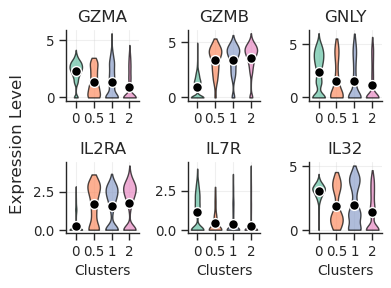

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

# First, prepare your data from adata_combined
genes = ['GZMA', 'GZMB', 'GNLY', 'IL2RA', 'IL7R', 'IL32']

# Convert scanpy data to pandas DataFrame in long format
plot_data = []
for gene in genes:
    # Extract expression data for the gene
    if hasattr(adata_combined[:, gene].X, 'toarray'):
        # If sparse matrix
        expression_values = adata_combined[:, gene].X.toarray().flatten()
    else:
        # If dense matrix
        expression_values = adata_combined[:, gene].X.flatten()
    
    gene_data = pd.DataFrame({
        'expression': expression_values,
        'cluster': adata_combined.obs['dose'].values,
        'gene': gene
    })
    plot_data.append(gene_data)

# Combine all genes into one DataFrame
df_plot = pd.concat(plot_data, ignore_index=True)

# Now your plotting code
sns.set_theme(style="ticks", context="paper", font_scale=1.1)

# Use Set2 color palette for clusters
n_clusters = len(df_plot['cluster'].unique())
cluster_colors = sns.color_palette("Set2", n_clusters)

fig, axes = plt.subplots(2, 3, figsize=(3.8, 3), facecolor='white')
axes = axes.flatten()

for i, gene in enumerate(genes):
    gene_data = df_plot[df_plot['gene'] == gene]
    
    # Create violin plot (turn off all default statistical indicators)
    parts = axes[i].violinplot(
        [gene_data[gene_data['cluster'] == cluster]['expression'].values 
         for cluster in sorted(gene_data['cluster'].unique())],
        positions=range(len(gene_data['cluster'].unique())),
        widths=0.7,
        showmeans=False,   # Turn off default means
        showmedians=False, # Turn off default medians
        showextrema=False  # Turn off min/max bars
    )
    
    # Customize violin colors using Set2 palette for clusters
    for j, pc in enumerate(parts['bodies']):
        pc.set_facecolor(cluster_colors[j])
        pc.set_alpha(0.7)
        pc.set_edgecolor('black')
        pc.set_linewidth(1)
    
    # Add custom mean dots (now black) - ONLY THESE DOTS
    for j, cluster in enumerate(sorted(gene_data['cluster'].unique())):
        cluster_data = gene_data[gene_data['cluster'] == cluster]['expression']
        mean_val = cluster_data.mean()
        axes[i].scatter(j, mean_val, color='black', s=50, zorder=3, 
                       edgecolors='white', linewidth=1)
    
    axes[i].set_title(f'{gene}', fontsize=12)
    
    # Only add x-labels to bottom row
    if i >= 3:  # Bottom row (indices 3, 4, 5)
        axes[i].set_xlabel('Clusters', fontsize=10)
    else:
        axes[i].set_xlabel('')
    
    # Remove individual y-labels from all subplots
    axes[i].set_ylabel('')
    
    axes[i].set_xticks(range(len(gene_data['cluster'].unique())))
    axes[i].set_xticklabels(sorted(gene_data['cluster'].unique()))
    axes[i].grid(True, alpha=0.3)
    sns.despine(ax=axes[i])

# Add shared y-label centered between the two rows, positioned further left
fig.text(-0.02, 0.5, 'Expression Level', va='center', rotation='vertical', fontsize=12)

plt.tight_layout()
plt.savefig(f'{out_dir}/tcell_violin_advanced_dose.pdf', dpi=300, bbox_inches='tight')
plt.savefig(f'{out_dir}/tcell_violin_advanced_dose.svg', dpi=300, bbox_inches='tight')
plt.savefig(f'{out_dir}/tcell_violin_advanced_dose.png', dpi=300, bbox_inches='tight')

In [ ]:
adata_combined.layers['counts'][1:100,1:100].toarray()  # Convert sparse matrix to dense format if needed

array([[0., 0., 0., ..., 0., 0., 1.],
       [0., 0., 0., ..., 0., 1., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 1., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 1., 0., 0.]], dtype=float32)

In [ ]:
adata_combined

AnnData object with n_obs × n_vars = 5463 × 5000
    obs: 'dose', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'dosage', 'n_genes', 'doublet_score', 'is_doublet', 'leiden'
    var: 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'dosage_colors', 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'leiden', 'leiden_colors', 'rank_genes_groups'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    layers: 'counts', 'normalized'
    obsp: 'distances', 'connectivities'

In [ ]:
adata_combined.layers['normalized']

<5463x5000 sparse matrix of type '<class 'numpy.float32'>'
	with 993779 stored elements in Compressed Sparse Row format>

In [ ]:
adata_combined.write_h5ad(f"{out_dir}/adata_combined_filtered.h5ad")

In [ ]:
markers_df = pd.read_excel('~/Documents/Kinase_project/10X_GBM_exposed_Tcells_1/T_cell_process.xlsx')

#cell_dic
select_sigs = markers_df.columns

markers_df = markers_df[select_sigs]

cells = markers_df.columns.values

marker_genes = []
cell_dic_plot = {}
for c in cells:
    cc = np.array(markers_df[c].values.tolist())
    marker_genes = np.append(marker_genes,[x for x in cc if str(x) != 'nan'])
    cell_dic_plot[c] = [x for x in cc if str(x) != 'nan']

embedding=adata_combined.obsm["X_umap"]
embedding

plt.figure(figsize=(6, 5)) 
for i in cell_dic_plot.keys():
    print(i)
    genes = cell_dic_plot[i]
    genes_up = []
    for g in genes:
        genes_up = np.append(genes_up,g.upper())
    select_genes_pos = []
    select_genes_neg = []
    for gene in genes_up:
        if "-" in gene and "+" in gene:
            continue
        elif "-" in gene:
            select_genes_neg.append(gene.split("-")[0].strip())
        else:
            select_genes_pos.append(gene.split("+")[0].strip())
    genes_up_pos = np.array(select_genes_pos)
    genes_up_neg = np.array(select_genes_neg)
    
    # get intersection
    top_genes_pos = np.intersect1d(adata_combined.var.index, genes_up_pos)
    top_genes_neg = np.intersect1d(adata_combined.var.index, genes_up_neg)
    if len(top_genes_pos) > 0:
        sc.pl.umap(adata_combined, color=top_genes_pos, layer='normalized')
    if len(top_genes_neg) > 0:
        sc.pl.umap(adata_combined, color=top_genes_neg, layer='normalized')
    
    # Use normalized layer instead of .to_df()
    normalized_data = adata_combined.layers['normalized']
    gene_pos_indices = [adata_combined.var.index.get_loc(gene) for gene in top_genes_pos]
    gene_neg_indices = [adata_combined.var.index.get_loc(gene) for gene in top_genes_neg]
    
    val_pos = np.sum(normalized_data[:, gene_pos_indices], axis=1)
    val_pos = np.array(val_pos).flatten()
    
    if len(gene_neg_indices) > 0:
        val_neg = np.sum(normalized_data[:, gene_neg_indices] * -1, axis=1)
        val_neg = np.array(val_neg).flatten()
    else:
        val_neg = np.zeros_like(val_pos)
    
    val = val_neg + val_pos
    label = i
    adata_combined.obs[label] = val/(len(top_genes_pos)+len(top_genes_neg))
    
    f, ax = plt.subplots()
    points = ax.scatter(embedding[:, 0], embedding[:, 1], c=adata_combined.obs[label].values, s=2, edgecolors='none')
    plt.title(i)
    f.colorbar(points)
    plt.show()

array([[-4.8523493 , 13.205771  ],
       [-0.64657784, 13.960611  ],
       [-2.3172474 , 14.194693  ],
       ...,
       [12.137169  , 17.34475   ],
       [13.885388  , 17.250805  ],
       [12.43752   , 15.64189   ]], dtype=float32)

Pro 
inflammatory


<Figure size 600x500 with 0 Axes>

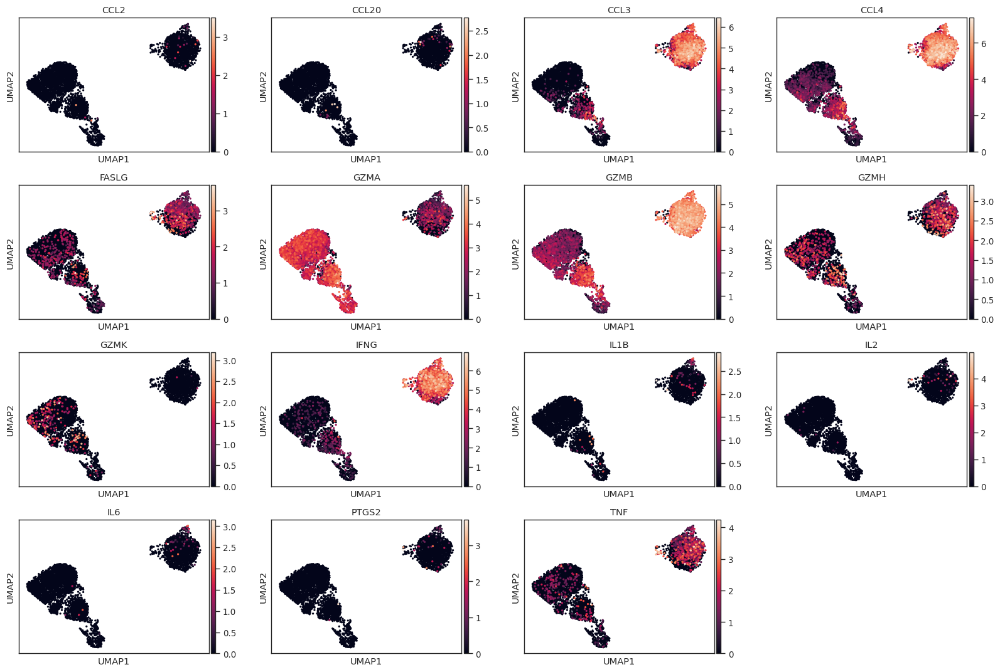

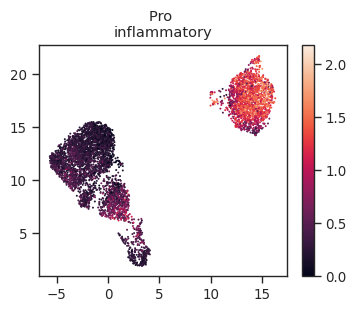

Cytolytics 
effector pathway


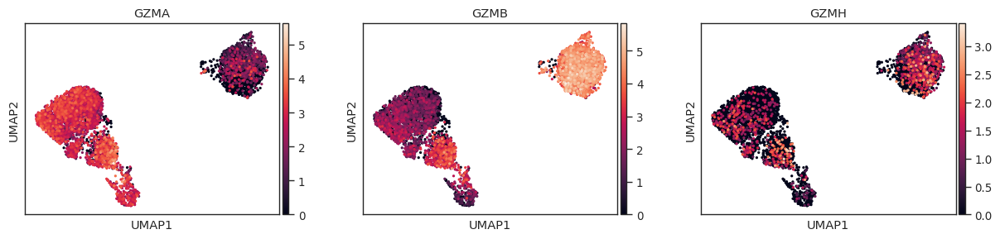

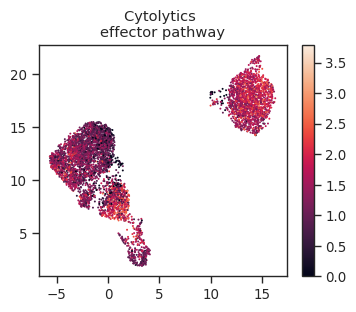

CD8 T cell 
activation


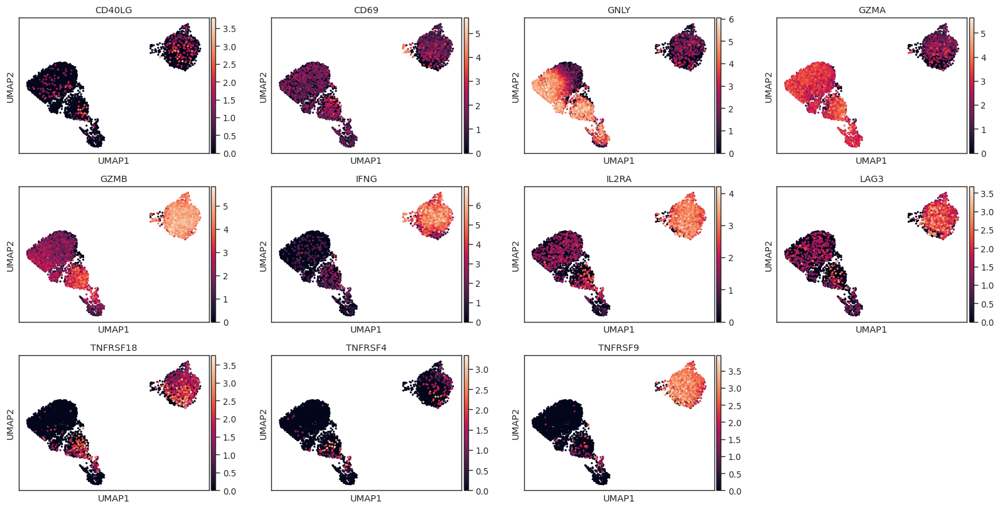

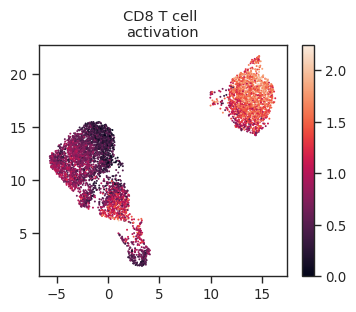

Type I interferon 
response


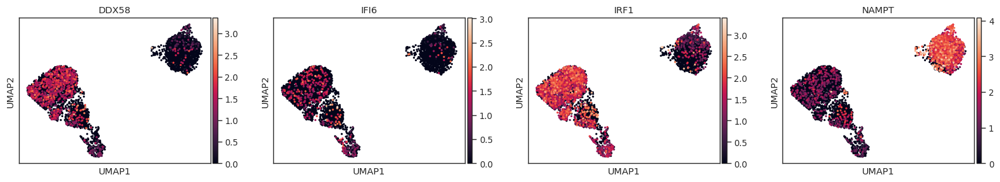

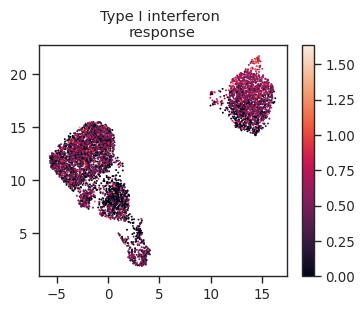

Type II interferon 
response


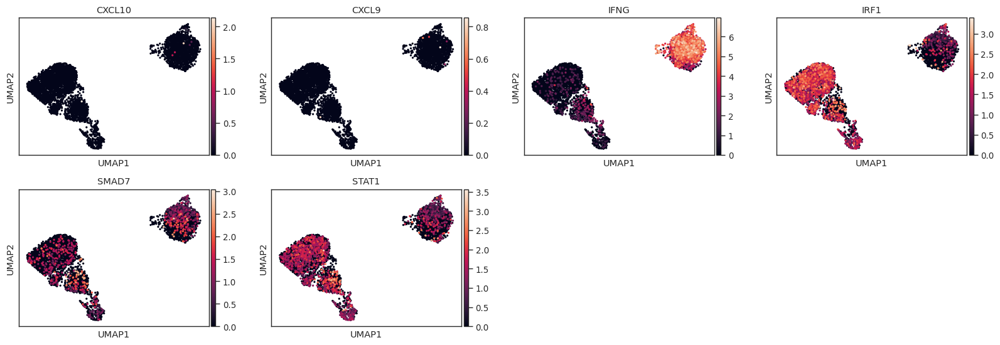

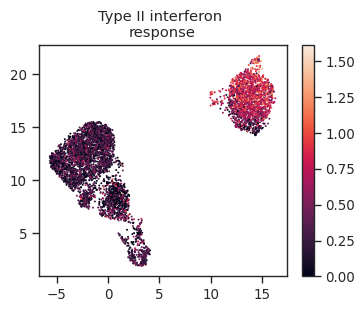

Exhaustion/Terminal 
differentiation


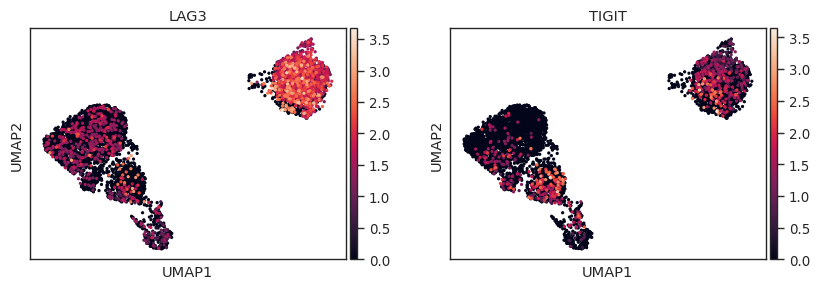

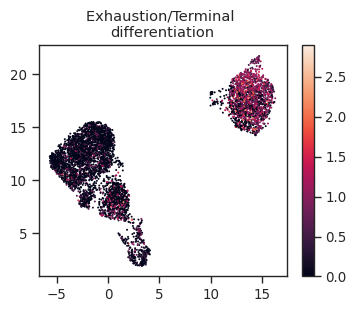

Glycogen 
metabolism


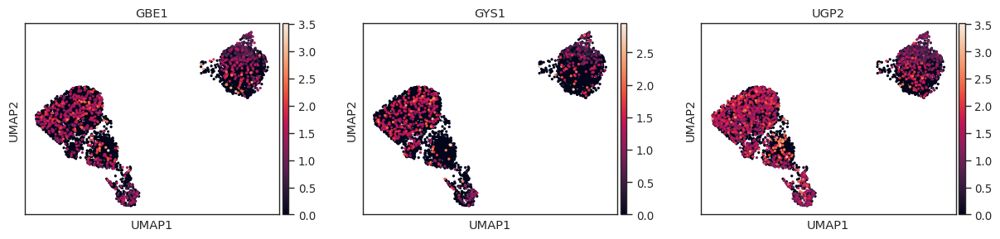

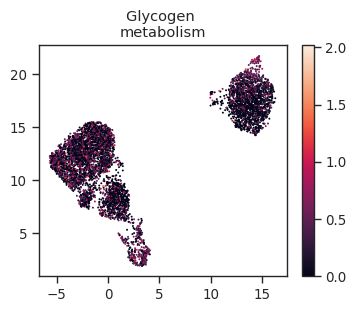

Hypoxia/HIF 
regulated


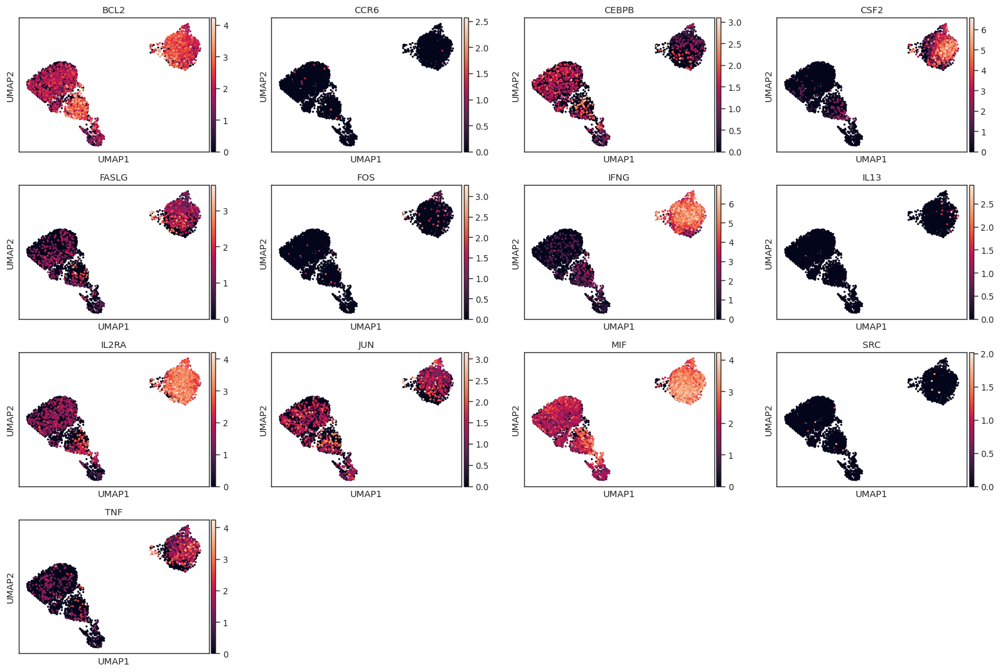

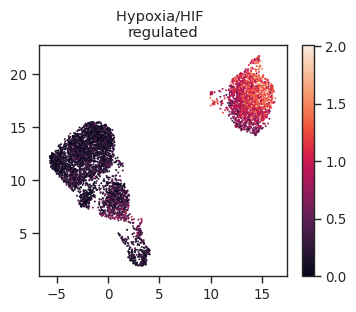

CD4+ T 
cell anergy


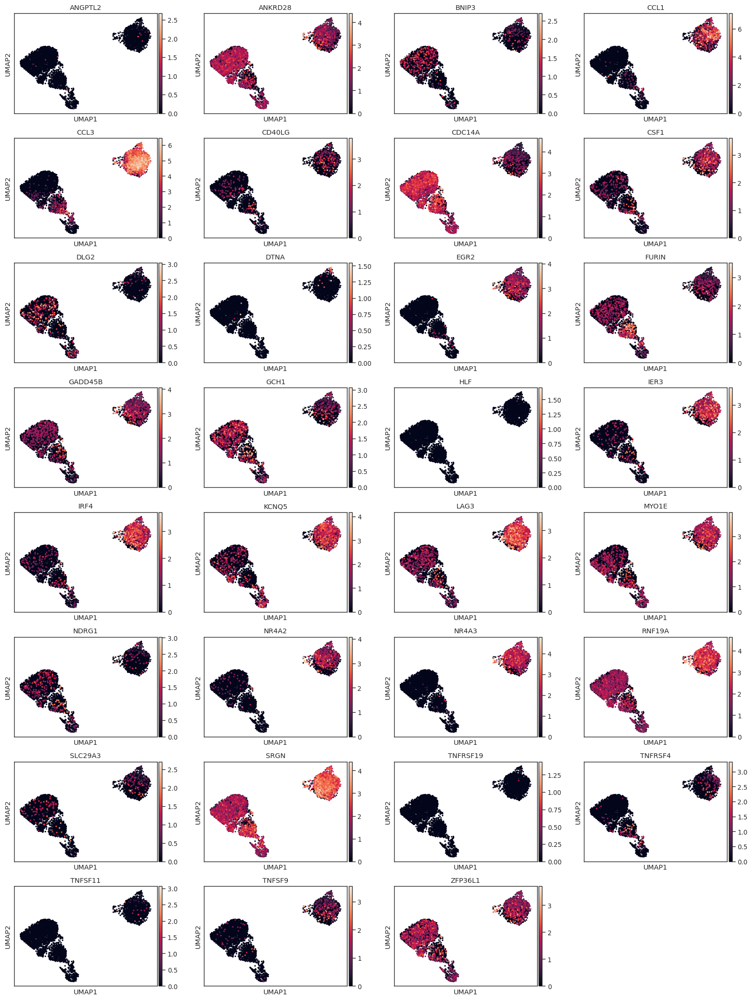

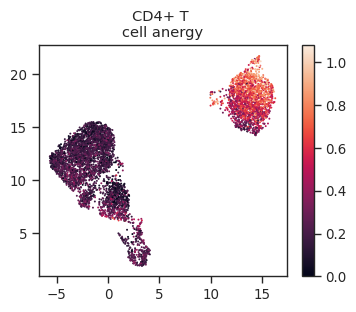

CD8+ deletional 
tolerance


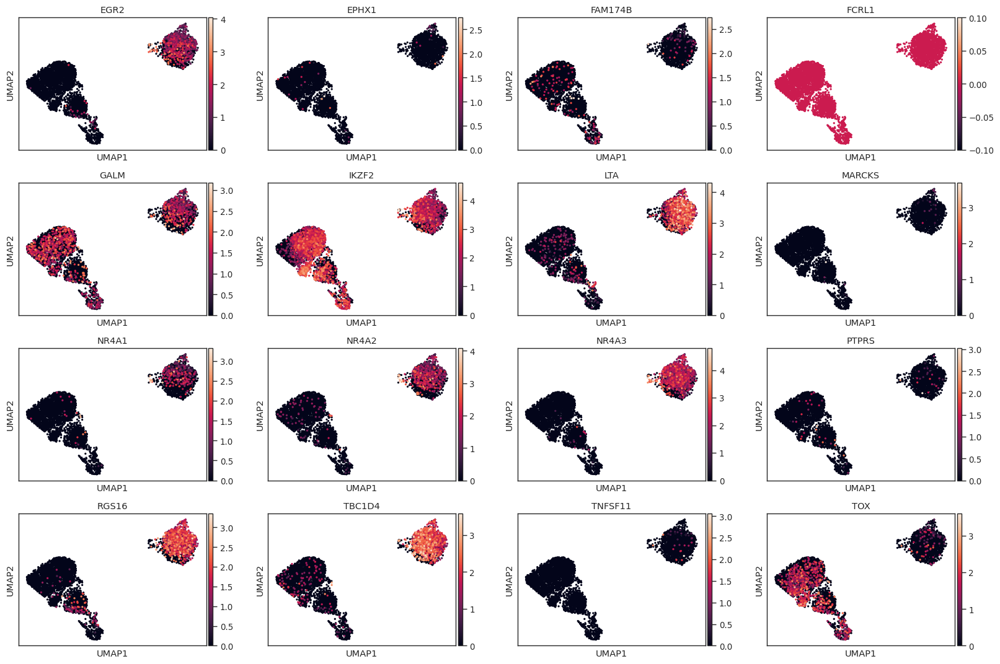

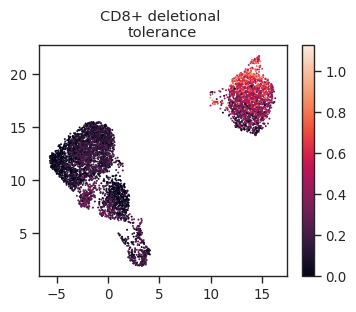

CD8+ TIL 
dysfunction


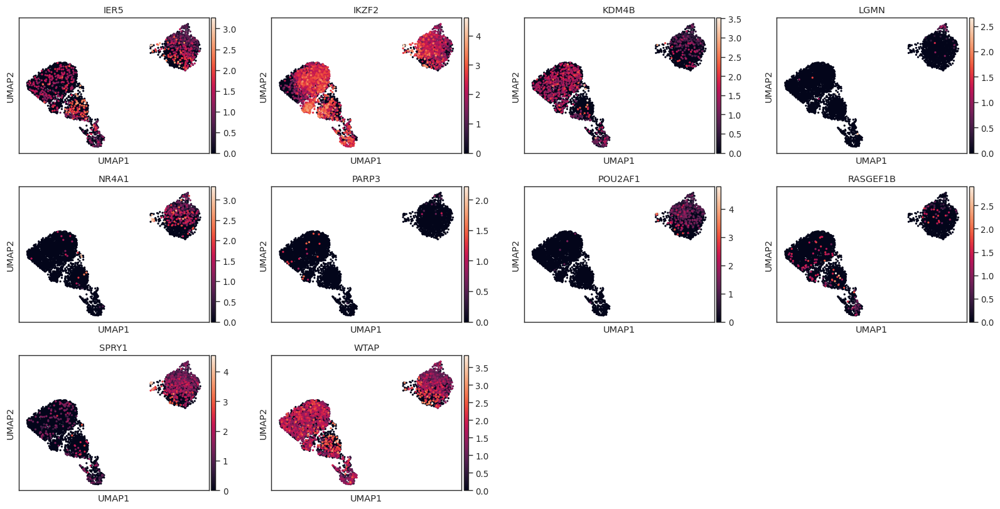

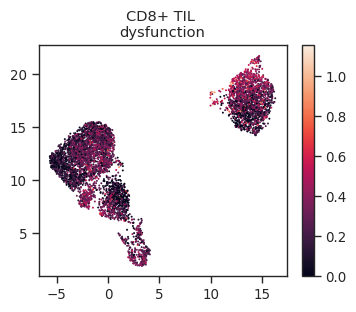

CD8+ peripheral 
tolerance


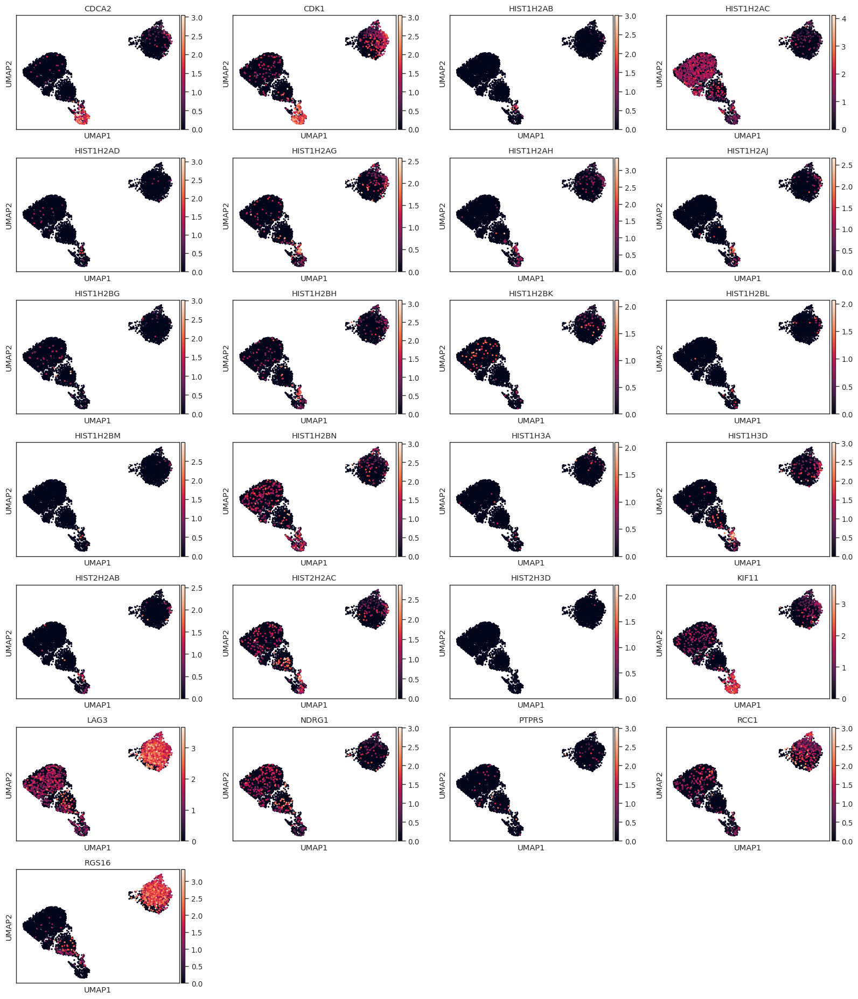

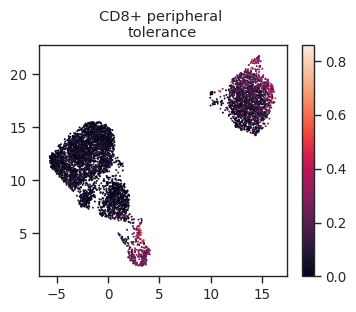

Anti-
inflammatory


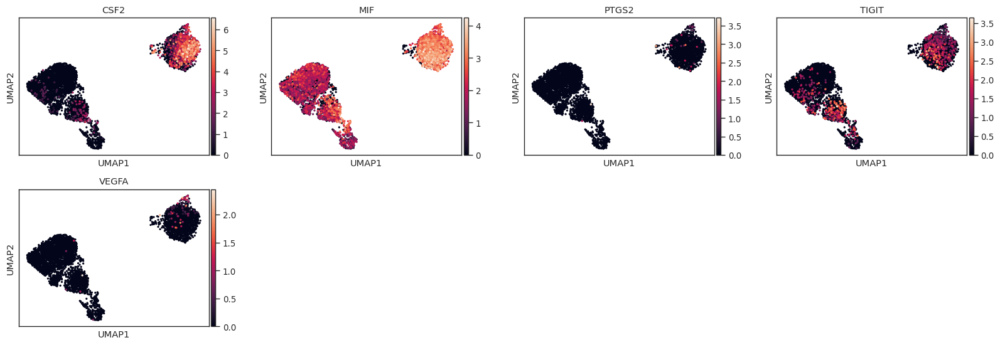

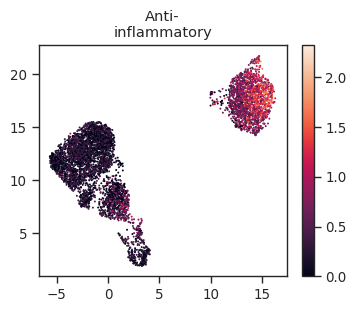

G2/M


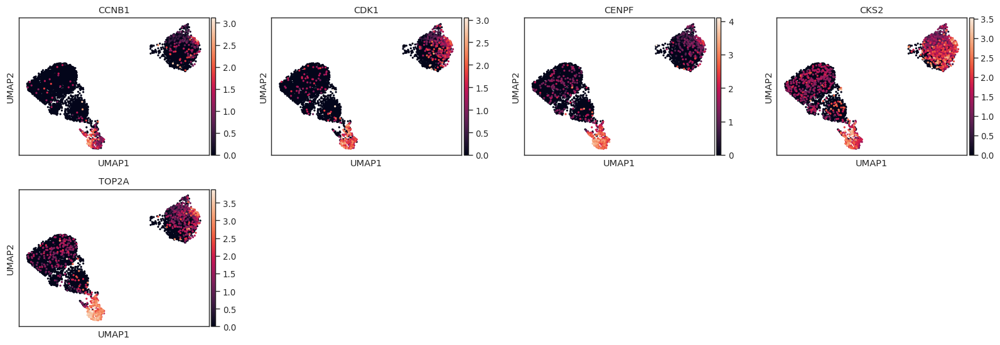

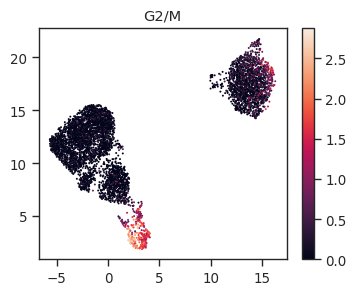

G1/S


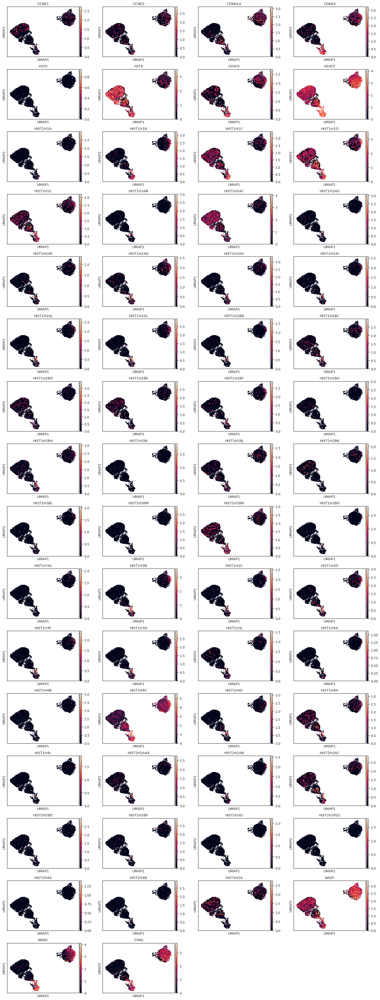

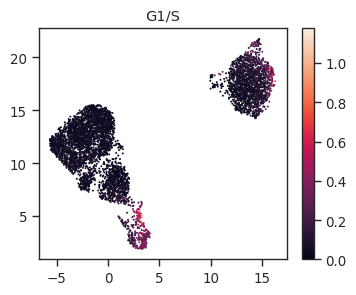

TCA cycle


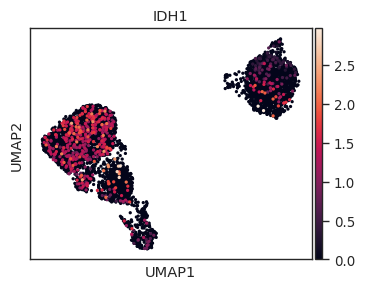

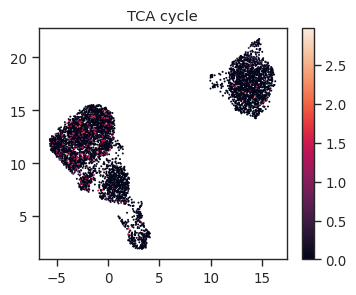

Pentose phosphate
 pathway


/tmp/ipykernel_3456529/2447215376.py:44: RuntimeWarning: invalid value encountered in divide
  adata_combined.obs[label] = val/(len(top_genes_pos)+len(top_genes_neg))


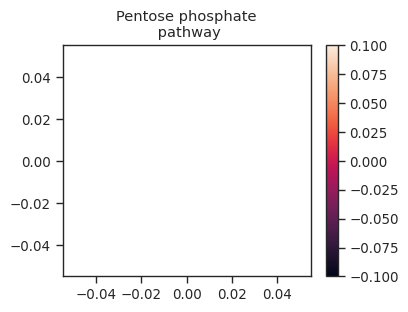

Senescence


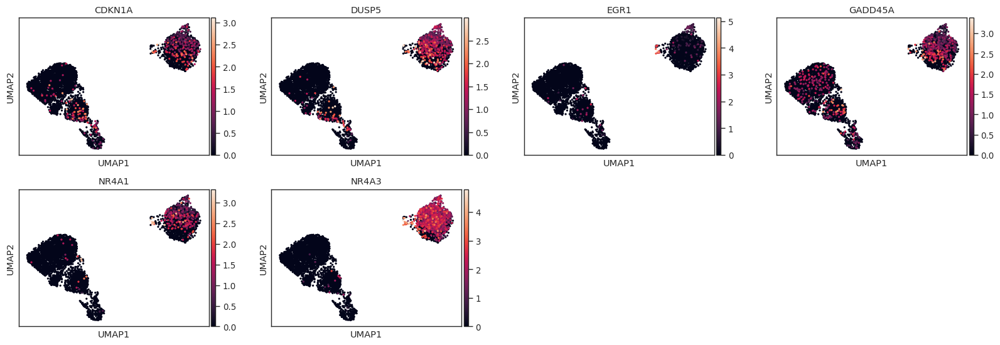

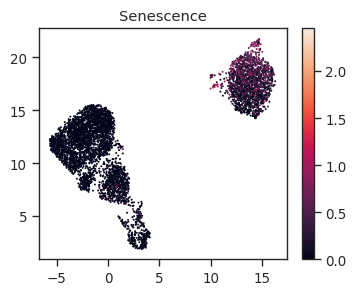

Adenosine 
pathway


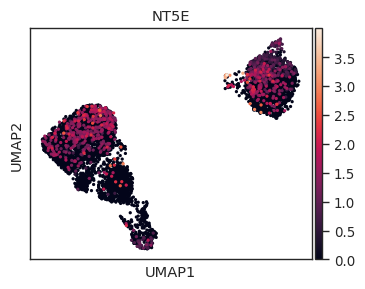

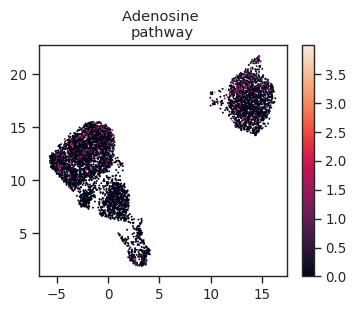

Glucose 
deprivation


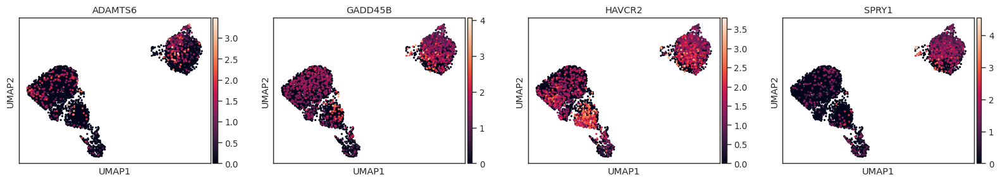

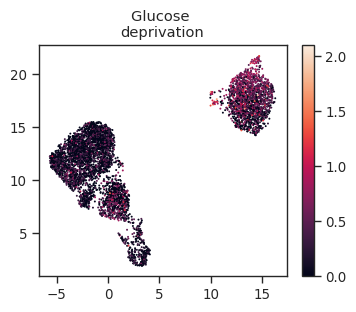

T cell co-
inhibitory receptors


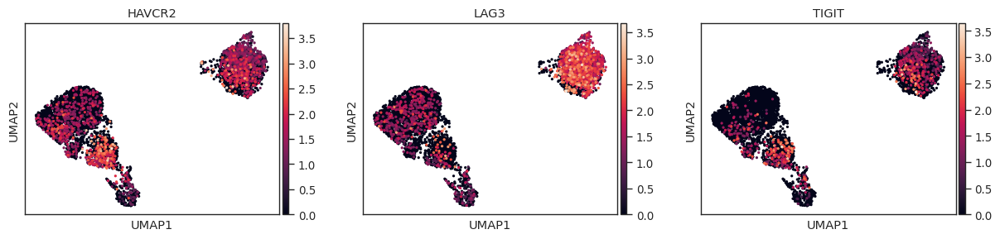

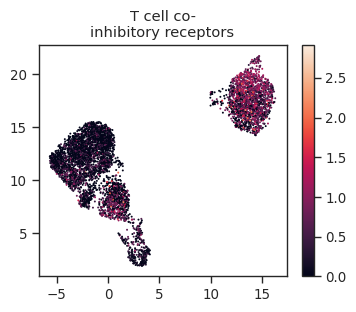

Effector cell 
cytotoxicity


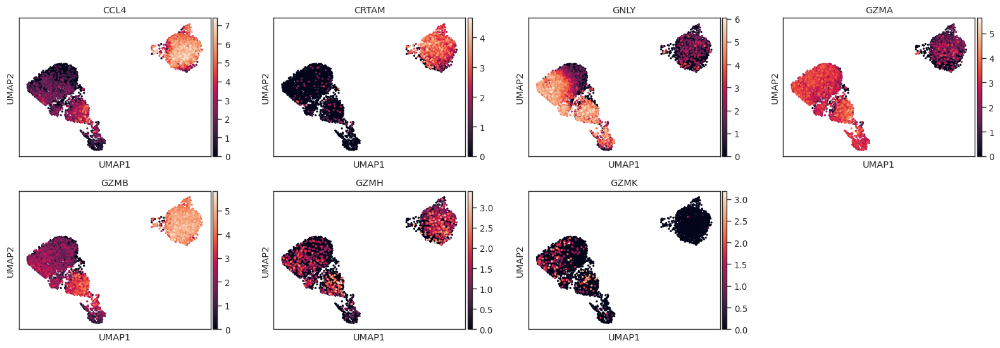

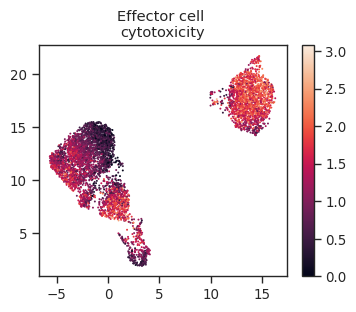